# Next Stop: Rail-Induced Displacement of Immigrant Communities?
## Arroyo Seco Collective
### By Erik Felix and Kevin Liu

With Measure R’s passage in 2008, and Measure M’s passage in 2016,  LA Metro has been heavily investing in light rail. Metro’s L Line is a prime example. Completed in 2009 and cross cutting through both immigrant communities and wealthy white communities, the L Line traverses a particularly diverse segment of Los Angeles County making it a prime candidate for study. <br>

<em>Research question</em>: did Metro’s construction of the L Line through Arcadia, Pasadena, Highland Park, Chinatown, Boyle Heights, and East Los Angeles have a measurable impact on exacerbating displacement of foreign-born households who lived near the station? Or, is the trend around the station similar to trends happening neighborhood-wide?
<br>
<br>
To do this, we use the 2011 and 2019 ACS survey to calculate the percent change of foreign born population between 2011 and 2019, per census tract. We use this datapoint to understand how foreign born populations have changed around the station area and neighborhood at large, relative to the total population. Understanding if recent immigrants are having a harder, similar, or easier time living in the census tracts in the station area provides insight into the potential effect the rail investment may have on immigrant communities.

In [1]:
# Let's start by importing all of the libraries we'll need for our analyses

import pandas as pd

import geopandas as gpd

from shapely.geometry import Point

import contextily as ctx

import matplotlib.pyplot as plt

# for interactive plots
import plotly.express as px

# for network analysis
import networkx as nx

# for street network analysis
import osmnx as ox

# for map construction
import folium

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


We have four different data files that need merging, so the first section here is merging all our files into one geodataframe. We first merge our 2019 ACS data files which are two geojsons (table B01003 for Total Population, and Table B05007 for Foreign Born Residents). We then do the same and merge our 2011 ACS data files which are two csv’s (same tables). Finally, we bring together the 2011 and 2019 dataframes to create one big data frame with both ACS 2019 and 2011 files in it.
<br>
<br>
We also add a % Change Foreign Born column, which is calculated using the following formula:
<br>
<br>
(2019 Foreign Born / 2019 Population) - (2011 Foreign Born / 2011 Population) * 100
<br>
<br>
Lastly, we add station and region columns to designate which census tracts belong to station areas and regions for study. Adding these columns allows us to call our census tracts by name, making running the dataset through functions alot easier. We drop all rows (census tracts) that have null values in the region column, zeroing in our data set to our study regions and station areas.
<br>
<br>
For simplicity sake, we have not included the above processes and code in this notebook, and instead of exported the final gdf from our data wrangling notebook, and imported it here below.

In [2]:
gdf = gpd.read_file('acs_11_19_merged_stn+rgn.geojson')

In [3]:
gdf.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Entered 2000 or later,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,...,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,% Change Foreign Born,region,station,geometry
0,06037181000,"Census Tract 1810, Los Angeles, CA",6574.0,2172.0,161.0,88.0,0.0,1039.0,137.0,941.0,...,99.0,0.0,113.0,0.0,15.0,0.0,-5.569441,NELA,None,"MULTIPOLYGON (((-118.22860 34.14689, -118.2285..."
1,06037181300,"Census Tract 1813, Los Angeles, CA",3860.0,1428.0,188.0,77.0,8.0,845.0,144.0,491.0,...,77.0,0.0,43.0,0.0,57.0,0.0,-4.277401,NELA,None,"MULTIPOLYGON (((-118.22942 34.13411, -118.2294..."
2,06037181400,"Census Tract 1814, Los Angeles, CA",4832.0,2026.0,625.0,89.0,9.0,1160.0,303.0,775.0,...,66.0,0.0,150.0,40.0,46.0,25.0,-0.880861,NELA,None,"MULTIPOLYGON (((-118.21897 34.14000, -118.2173..."
3,06037181500,"Census Tract 1815, Los Angeles, CA",4035.0,1683.0,183.0,113.0,30.0,806.0,101.0,762.0,...,277.0,0.0,122.0,0.0,19.0,0.0,-10.516913,NELA,None,"MULTIPOLYGON (((-118.20153 34.13351, -118.2015..."
4,06037181600,"Census Tract 1816, Los Angeles, CA",4425.0,1125.0,278.0,49.0,27.0,369.0,154.0,675.0,...,126.0,0.0,44.0,11.0,64.0,17.0,2.453619,NELA,None,"MULTIPOLYGON (((-118.21828 34.13188, -118.2181..."


## Interactive Station Area Preview Maps

Below we created interactive folium maps marking our stations to provide context within the greater Los Angeles area.

In [4]:
# default folium map
m = folium.Map()
m

Zooming in on Los Angeles using the average lat long of our gdf.

In [5]:
# average latitude
minx, miny, maxx, maxy = gdf.geometry.total_bounds

In [6]:
print(minx, miny, maxx, maxy)

-118.274504 33.974409 -117.942334 34.251543


In [7]:
center_lat_gdf = (maxy-miny)/2+miny
center_lat_gdf

34.112976

In [8]:
center_lon_gdf = (maxx-minx)/2+minx
center_lon_gdf

-118.108419

Creating our East LA Civic Center station preview utilizing lat long coordinates for the station area, and dropping a marker labelling our station.

In [9]:
#folium map centered around our gdf
m = folium.Map(location=[34.0332, -118.1614], zoom_start=14)

# add folium marker code
folium.Marker([34.0332, -118.1614], 
              popup='East LA Civic Center', 
              tooltip='East LA Civic Center',
              icon=folium.Icon(color='orange', icon='train', prefix='fa')).add_to(m)

m

**ADD CODE FOR ALL STATIONS INTERACTIVE FOLIUM**

## Chloropleth and Walkshed Mapping for Each Station Area

### Station Area Isochrone Walkshed Convex Hull

First we establish the census tracts associated with our station areas by including all tracts within a 10 minute walk of each station node in Open Street Maps data.

#### East LA Civic Center

Bringing in the address and establishing the time criteria for the walkshed. 

In [10]:
# Let's start by orienting ourselves around the East LA Civic Center Station by calling for it by address in osmnx

address = 'East Los Angeles Civic Center, East 3rd Street, Belvedere Gardens, East Los Angeles, Los Angeles County, California, 90022-1601, United States'
network_type = 'walk'
trip_times = [10] #in minutes
meters_per_minute = 80 # travel distance per minute

In [11]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# download the street network
G = ox.graph_from_address(address, network_type=network_type, dist = 1500)

CPU times: user 3.35 s, sys: 118 ms, total: 3.47 s
Wall time: 12.3 s


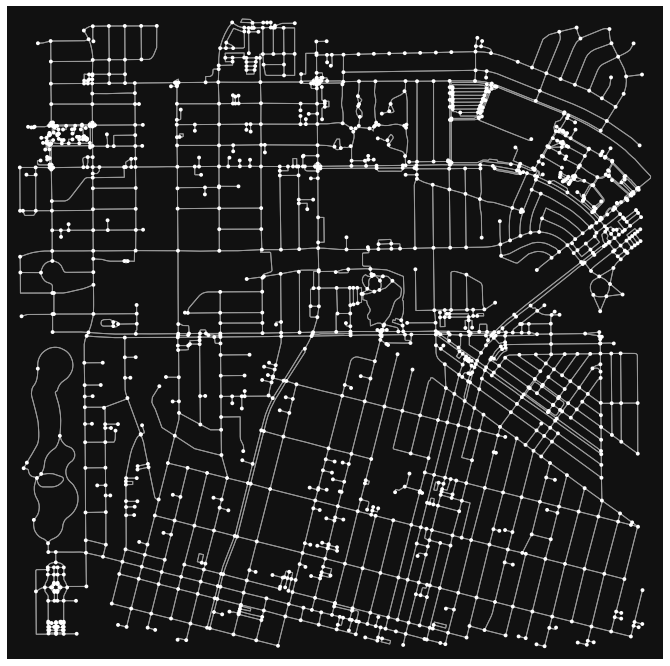

In [12]:
fig, ax = ox.plot_graph(G,figsize=(12,12))

In [13]:
G = ox.project_graph(G, to_crs='epsg:3857')

In [14]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [15]:
gdf_nodes.head()

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
17445327,4.033839e+06,-1.315200e+07,traffic_signals,4,-118.146421,34.037501,POINT (-13151999.403 4033838.580)
8414804812,4.033816e+06,-1.315203e+07,NaN,3,-118.146684,34.037336,POINT (-13152028.735 4033816.401)
8414804800,4.033858e+06,-1.315197e+07,NaN,3,-118.146197,34.037648,POINT (-13151974.467 4033858.327)
3643016816,4.033796e+06,-1.315196e+07,NaN,4,-118.146107,34.037181,POINT (-13151964.459 4033795.566)
8414804799,4.033863e+06,-1.315202e+07,NaN,3,-118.146602,34.037683,POINT (-13152019.540 4033863.055)


<AxesSubplot:>

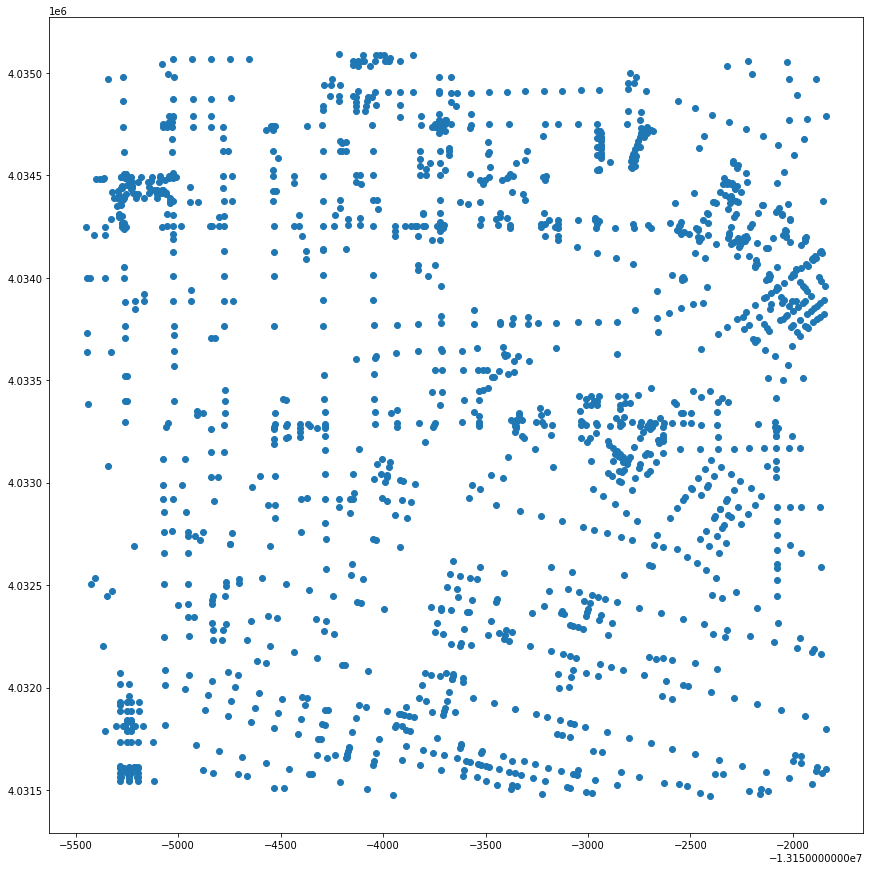

In [16]:
gdf_nodes.plot(figsize=(15,15))

In [17]:
gdf_edges.head()

osmid lanes                  name    highway  \
u          v          key                                                      
17445327   8414804812 0     397475166     7    Atlantic Boulevard    primary   
           8414804800 0     397479970     7    Atlantic Boulevard    primary   
           3643016816 0     397516716     5    West Reggin Street  secondary   
           8414804799 0    1036305858     5  Avenida Cesar Chavez  secondary   
8414804812 17445327   0     397475166     7    Atlantic Boulevard    primary   

                          maxspeed  oneway  length  \
u          v          key                            
17445327   8414804812 0     35 mph   False  30.439   
           8414804800 0     35 mph   False  26.329   
           3643016816 0        NaN   False  45.873   
           8414804799 0        NaN   False  26.236   
8414804812 17445327   0     35 mph   False  30.439   

                                                                    geometry  \
u          v          key                                                      
17445327   8414804812 0    LINESTRING (-13151999.403 4033838.580, -131520...   
           8414804800 0    LINESTRING (-13151999.403 4033838.580, -131519...   
           3643016816 0    LINESTRING (-13151999.403 4033838.580, -131519...   
           8414804799 0    LINESTRING (-13151999.403 4033838.580, -131520...   
8414804812 17445327   0    LINESTRING (-13152028.735 4033816.401, -131519...   

                          access service  ref bridge tunnel  
u          v          key                                    
17445327   8414804812 0      NaN     NaN  NaN    NaN    NaN  
           8414804800 0      NaN     NaN  NaN    NaN    NaN  
           3643016816 0      NaN     NaN  NaN    NaN    NaN  
           8414804799 0      NaN     NaN  NaN    NaN    NaN  
8414804812 17445327   0      NaN     NaN  NaN    NaN    NaN

<AxesSubplot:>

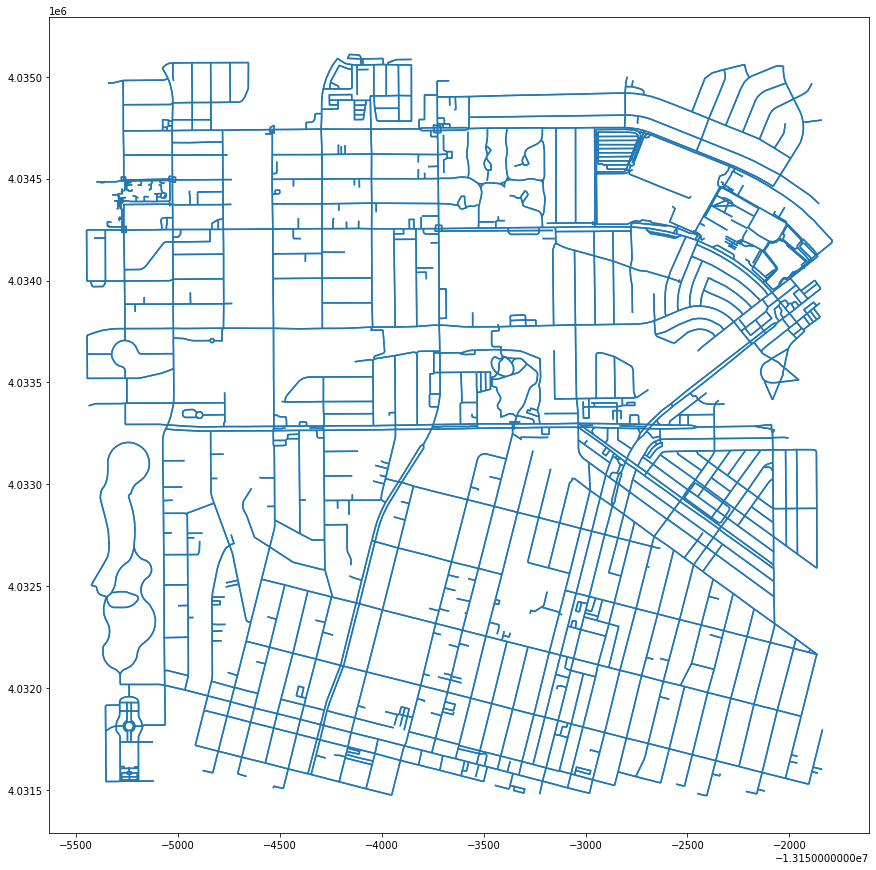

In [18]:
gdf_edges.plot(figsize=(15,15))

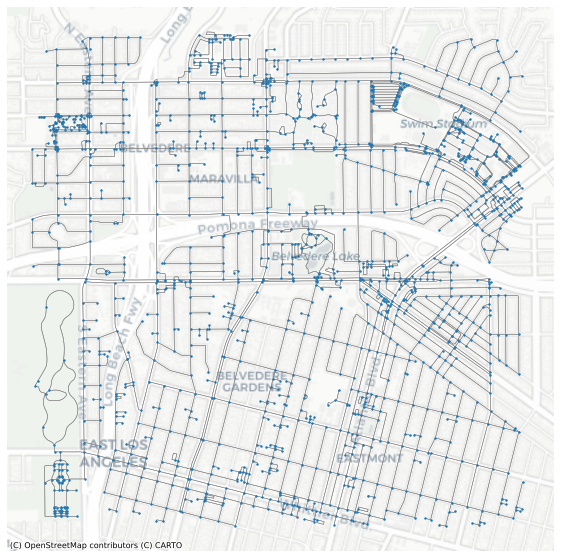

In [19]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)


# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [20]:
# get the bounding box coordinates
minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds
print(minx)
print(miny)
print(maxx)
print(maxy)

-13155448.347495379
4031471.857767747
-13151837.354721077
4035089.507649423


In [21]:
# calculate the centroid
centroid_x = (maxx-minx)/2 + minx
centroid_y = (maxy-miny)/2 + miny
print(centroid_x)
print(centroid_y)

-13153642.851108227
4033280.6827085847


In [22]:
# use osmnx's distance.nearest_nodes command to get the id for the nearest node
center_node1 = ox.distance.nearest_nodes(G,Y=centroid_y,X=centroid_x)
print('The id for the nearest node is ' + str(center_node1))

The id for the nearest node is 269612210


In [23]:
# what is this record?
gdf_nodes.loc[[center_node1]]

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
269612210,4.033295e+06,-1.315361e+07,NaN,3,-118.160921,34.033453,POINT (-13153613.569 4033294.845)


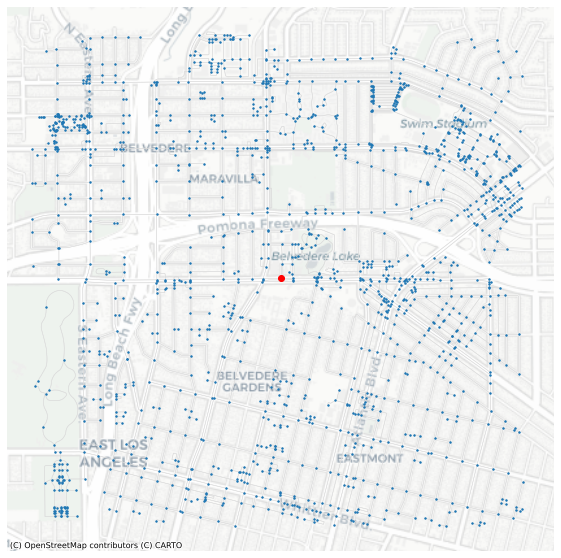

In [24]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gainsboro', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)

# add the center node in red also to ax
gdf_nodes.loc[[center_node1]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron, zoom=14)

In [25]:
gdf_edges.sample(5)

,,,osmid,lanes,name,highway,maxspeed,oneway,length,geometry,access,service,ref,bridge,tunnel
u,v,key,,,,,,,,,,,,,
123480177,123227725,0,13468276,NaN,South Carmelita Avenue,residential,NaN,False,75.855,"LINESTRING (-13155446.633 4033730.669, -131554...",NaN,NaN,NaN,NaN,NaN
8777112372,8777112425,0,948222685,NaN,NaN,footway,NaN,False,15.882,"LINESTRING (-13155291.153 4034401.806, -131552...",NaN,NaN,NaN,NaN,NaN
122904583,122813403,0,1001013335,2,North McDonnell Avenue,residential,NaN,False,103.594,"LINESTRING (-13154297.393 4034743.200, -131542...",NaN,NaN,NaN,NaN,NaN
4219849859,122743564,0,13409181,NaN,Repetto Street,residential,NaN,False,60.176,"LINESTRING (-13152928.375 4032935.173, -131528...",NaN,NaN,NaN,NaN,NaN
6726759177,6726759179,0,715783502,NaN,NaN,service,NaN,False,36.420,"LINESTRING (-13154027.599 4034379.425, -131540...",NaN,NaN,NaN,NaN,NaN


In [26]:
gdf_edges['walk_time'] = (gdf_edges['length']/meters_per_minute)

In [27]:
gdf_edges.sample(5)

,,,osmid,lanes,name,highway,maxspeed,oneway,length,geometry,access,service,ref,bridge,tunnel,walk_time
u,v,key,,,,,,,,,,,,,,
8840721529,8840758101,0,955178519,NaN,NaN,footway,NaN,False,348.117,"LINESTRING (-13152292.919 4034560.532, -131523...",NaN,NaN,NaN,NaN,NaN,4.351463
6726135601,123114357,0,13373487,2,North McDonnell Avenue,residential,NaN,False,5.137,"LINESTRING (-13154293.085 4034139.064, -131542...",NaN,NaN,NaN,NaN,NaN,0.064212
123042204,123042201,0,1013695456,NaN,Sadler Avenue,tertiary,NaN,False,259.769,"LINESTRING (-13152173.651 4031920.492, -131521...",NaN,NaN,NaN,NaN,NaN,3.247113
6726347350,122692708,0,23377419,NaN,Gerhart Avenue,residential,NaN,False,70.824,"LINESTRING (-13151998.345 4031640.387, -131520...",NaN,NaN,NaN,NaN,NaN,0.885300
8777112247,122820066,0,"[397521916, 397521917, 404892309]",5,North Eastern Avenue,primary,40 mph,False,93.062,"LINESTRING (-13155026.981 4034485.474, -131550...",NaN,NaN,NaN,NaN,NaN,1.163275


In [28]:
# assign a color hex code for each trip time isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap='plasma', 
                                start=0, 
                                return_hex=True)
print(trip_times)
print(iso_colors)

[10]
['#0d0887']


In [29]:
time_color = list(zip(trip_times, iso_colors))
time_color

[(10, '#0d0887')]

In [30]:
for time, color in list(time_color):

    # for each trip time, create an egograph of nodes that fall within that distance
    subgraph = nx.ego_graph(G, 269612210, radius=time)

    print('There are ' + str(len(subgraph.nodes())) + ' nodes within ' + str(time) + ' minutes ')
    
    # for each of those nodes, update the gdf_nodes dataframe and assign it with its associated distance color
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = str(time) + ' mins'
        gdf_nodes.loc[node,'color'] = color

There are 271 nodes within 10 minutes 


In [31]:
gdf_nodes.sample(30)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
7162161551,4.034662e+06,-1.315349e+07,NaN,3,-118.159790,34.043630,POINT (-13153487.655 4034661.961),NaN,NaN
7072288121,4.034608e+06,-1.315278e+07,NaN,3,-118.153404,34.043231,POINT (-13152776.758 4034608.398),NaN,NaN
7859977760,4.034858e+06,-1.315367e+07,NaN,1,-118.161395,34.045089,POINT (-13153666.301 4034857.932),NaN,NaN
6735480901,4.034305e+06,-1.315423e+07,NaN,1,-118.166484,34.040971,POINT (-13154232.850 4034304.812),NaN,NaN
6787988995,4.035089e+06,-1.315401e+07,NaN,3,-118.164522,34.046807,POINT (-13154014.452 4035088.849),NaN,NaN
7072288098,4.034600e+06,-1.315295e+07,NaN,3,-118.155004,34.043167,POINT (-13152954.824 4034599.787),NaN,NaN
1932469545,4.033766e+06,-1.315453e+07,traffic_signals,4,-118.169164,34.036957,POINT (-13154531.197 4033765.502),10 mins,#0d0887
2199148530,4.033282e+06,-1.315375e+07,NaN,3,-118.162158,34.033357,POINT (-13153751.304 4033281.923),10 mins,#0d0887
1746242157,4.033550e+06,-1.315354e+07,NaN,3,-118.160216,34.035355,POINT (-13153535.033 4033550.287),10 mins,#0d0887


In [32]:
gdf_nodes['color'].fillna('#cccccc', inplace=True)

In [33]:
gdf_nodes.sample(5)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
5544361544,4.034886e+06,-1.315415e+07,NaN,3,-118.165714,34.045296,POINT (-13154147.067 4034885.728),NaN,#cccccc
5544361311,4.035059e+06,-1.315404e+07,NaN,3,-118.164744,34.046583,POINT (-13154039.176 4035058.768),NaN,#cccccc
8272139276,4.032842e+06,-1.315232e+07,NaN,4,-118.149261,34.030084,POINT (-13152315.550 4032842.301),NaN,#cccccc
589969754,4.031831e+06,-1.315523e+07,NaN,3,-118.175434,34.022558,POINT (-13155229.171 4031831.457),NaN,#cccccc
7882750353,4.034250e+06,-1.315508e+07,NaN,3,-118.174089,34.040561,POINT (-13155079.412 4034249.665),NaN,#cccccc


<AxesSubplot:>

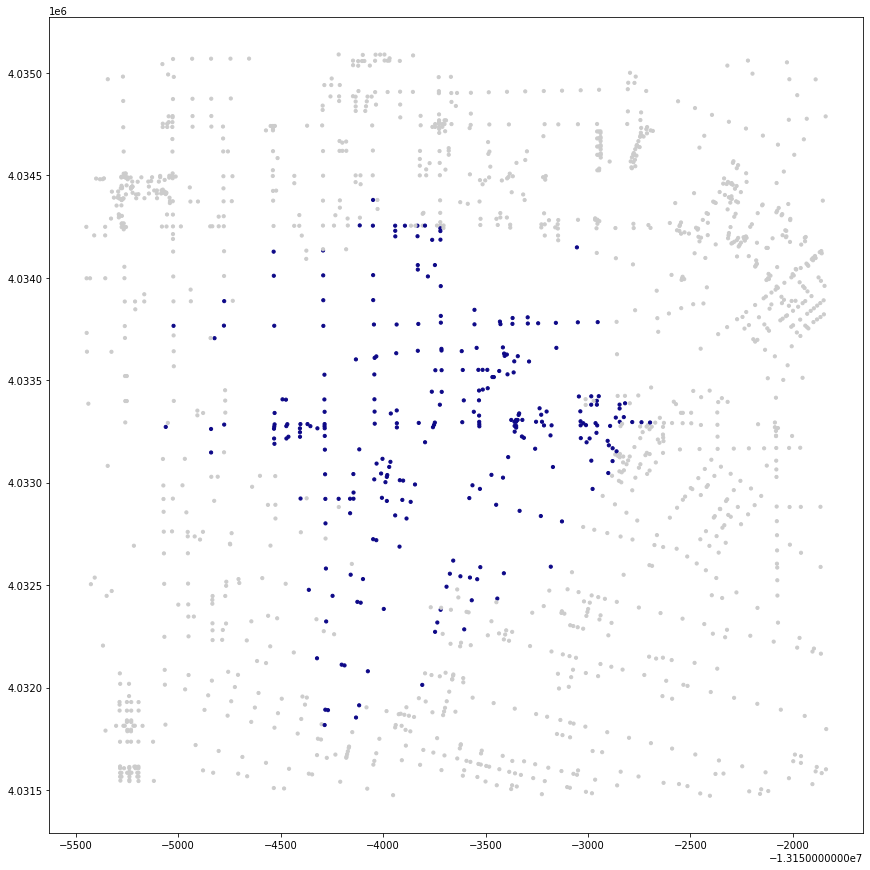

In [34]:
#plotting and taking a look at my nodes within the walkshed
gdf_nodes.plot(figsize=(15,15),
               color=gdf_nodes['color'],
               markersize=10)

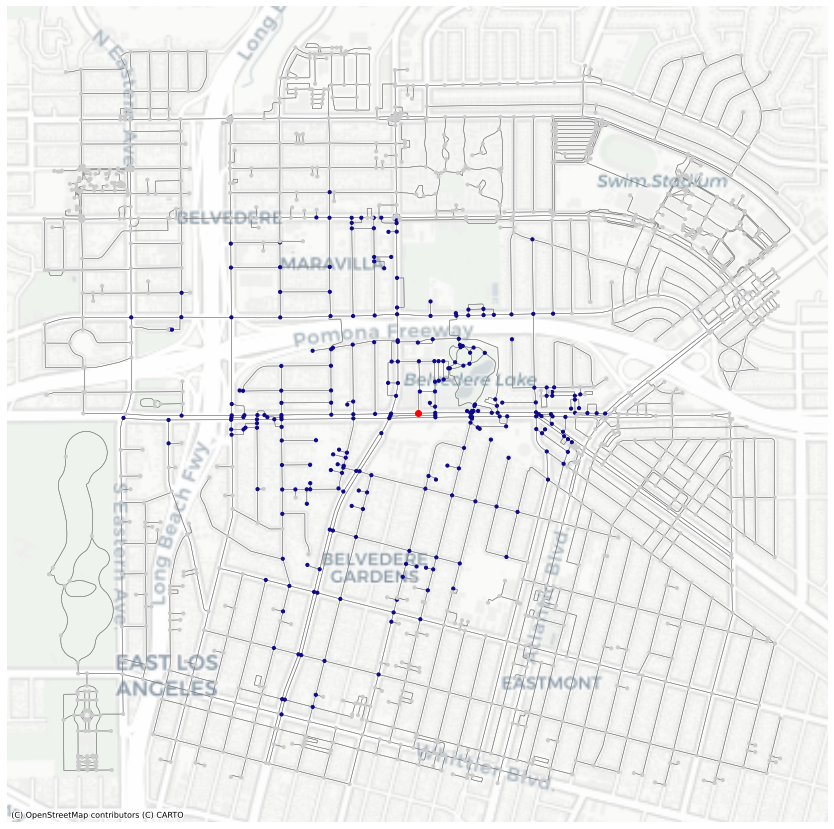

In [35]:
# a "full" map
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(15,15))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax,
               color=gdf_nodes['color'],
               markersize=10, 
               zorder=20)

# marking the station site with a red dot. Grabbed the station's node from OpenStreet Maps
gdf_nodes.loc[[269612210]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [36]:
gdf_nodes[gdf_nodes['time']=='10 mins']

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
6816488222,4.034241e+06,-1.315372e+07,NaN,4,-118.161882,34.040497,POINT (-13153720.558 4034241.067),10 mins,#0d0887
74673066,4.034127e+06,-1.315453e+07,traffic_signals,3,-118.169191,34.039649,POINT (-13154534.158 4034127.121),10 mins,#0d0887
6735157126,4.031892e+06,-1.315428e+07,NaN,3,-118.166926,34.023007,POINT (-13154282.009 4031891.776),10 mins,#0d0887
1742549940,4.031817e+06,-1.315429e+07,traffic_signals,4,-118.166954,34.022450,POINT (-13154285.181 4031816.938),10 mins,#0d0887
122584279,4.034009e+06,-1.315453e+07,NaN,3,-118.169183,34.038773,POINT (-13154533.324 4034009.495),10 mins,#0d0887
...,...,...,...,...,...,...,...,...,...
8361650777,4.033306e+06,-1.315332e+07,NaN,1,-118.158287,34.033536,POINT (-13153320.320 4033305.954),10 mins,#0d0887
8361650775,4.033306e+06,-1.315337e+07,NaN,1,-118.158774,34.033535,POINT (-13153374.566 4033305.806),10 mins,#0d0887
8361650779,4.033268e+06,-1.315335e+07,NaN,1,-118.158558,34.033256,POINT (-13153350.543 4033268.382),10 mins,#0d0887


In [37]:
#creating a new variable for 10 mins nodes
gdf_10 = gdf_nodes[gdf_nodes['time']=='10 mins']

<AxesSubplot:>

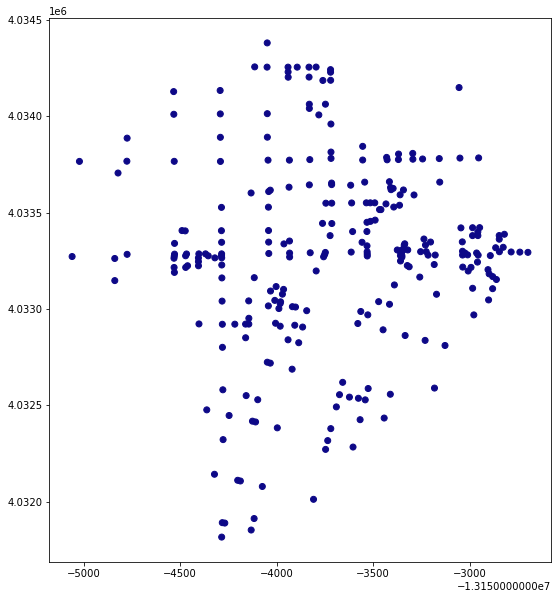

In [38]:
gdf_10.plot(figsize=(10,10),color=gdf_10.color)

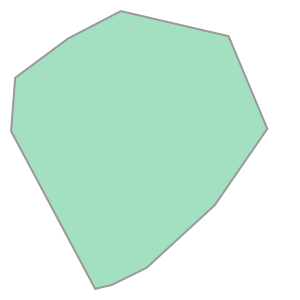

In [39]:
#creating our convex hull
gdf_10.unary_union.convex_hull

In [40]:
isochrones_civic = gdf_nodes.dissolve("time")
isochrones_civic

,geometry,y,x,highway,street_count,lon,lat,color
time,,,,,,,,
10 mins,"MULTIPOINT (-13155060.722 4033271.808, -131550...",4.034241e+06,-1.315372e+07,traffic_signals,4,-118.161882,34.040497,#0d0887


In [41]:
isochrones_civic = isochrones_civic.convex_hull.reset_index()
isochrones_civic

,time,0
0,10 mins,"POLYGON ((-13154285.181 4031816.938, -13155060..."


In [42]:
isochrones_civic.columns=['time','geometry']
isochrones_civic

,time,geometry
0,10 mins,"POLYGON ((-13154285.181 4031816.938, -13155060..."


In [43]:
isochrones_civic.loc[0, 'station'] = "East LA Civic Center"

In [44]:
isochrones_civic

,time,geometry,station
0,10 mins,"POLYGON ((-13154285.181 4031816.938, -13155060...",East LA Civic Center


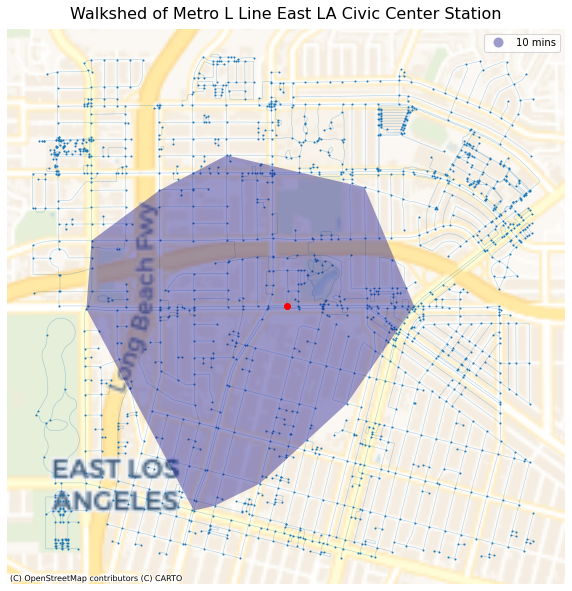

In [45]:
#plotting the convex hull on to the basemap

# set up the subplots
fig, ax = plt.subplots(figsize=(10,20))

# add the isochrones
isochrones_civic.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node1]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

# hide the axis
ax.axis('off')

# give it a title
ax.set_title('Walkshed of Metro L Line East LA Civic Center Station',fontsize=16,pad=10)

# add the basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager, zoom=13)

We go through this process with each station area, and wind up with 7 distinct walksheds. We concatenate all of our walksheds into one geodataframe, which is imported below:

In [47]:
isochrones = gpd.read_file('isochrones.geojson')

Next, we create the chloropleth maps representing "% Change in Foreign Born" for each station area.

### Station Area % Change Foreign Born Chloropleth Mapping

Using the 10 minute walkshed established by our convex hull, we create a chloropleth map representing "% Change in Foreign Born" for each station area. 

#### Creating a single choropleth map

To make sure everything is running smoothly, we run a single choropleth map for East LA Civic Center, just as we do above for the isochrones.

In [48]:
civic = gdf[gdf["FIPS"].isin(['06037530400', 
                              '06037530301', 
                              '06037531603',
                              '06037531604',
                              '06037531504',
                              '06037531503',
                              '06037531000',
                              '06037530500']
                                    )
                     ]

In [49]:
civic.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Entered 2000 or later,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,...,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,% Change Foreign Born,region,station,geometry
180,06037530301,"Census Tract 5303.01, Los Angeles, CA",2389.0,1190.0,181.0,4.0,0.0,36.0,0.0,1150.0,...,54.0,0.0,9.0,0.0,0.0,0.0,-10.689068,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.15978 34.02568, -118.1595..."
182,06037530400,"Census Tract 5304, Los Angeles, CA",3427.0,1015.0,85.0,0.0,0.0,274.0,16.0,715.0,...,161.0,0.0,14.0,0.0,0.0,0.0,4.837387,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.16186 34.03384, -118.1617..."
183,06037530500,"Census Tract 5305, Los Angeles, CA",4555.0,1560.0,327.0,1.0,0.0,0.0,0.0,1557.0,...,181.0,18.0,0.0,0.0,12.0,0.0,6.515567,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.16991 34.03369, -118.1698..."
191,06037531000,"Census Tract 5310, Los Angeles, CA",5219.0,2134.0,434.0,9.0,0.0,0.0,0.0,2124.0,...,135.0,0.0,9.0,0.0,0.0,0.0,-6.016665,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.17866 34.03421, -118.1786..."
198,06037531503,"Census Tract 5315.03, Los Angeles, CA",3651.0,1826.0,600.0,0.0,0.0,0.0,0.0,1826.0,...,109.0,0.0,0.0,0.0,0.0,0.0,-15.651181,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.18047 34.03340, -118.1804..."


<AxesSubplot:>

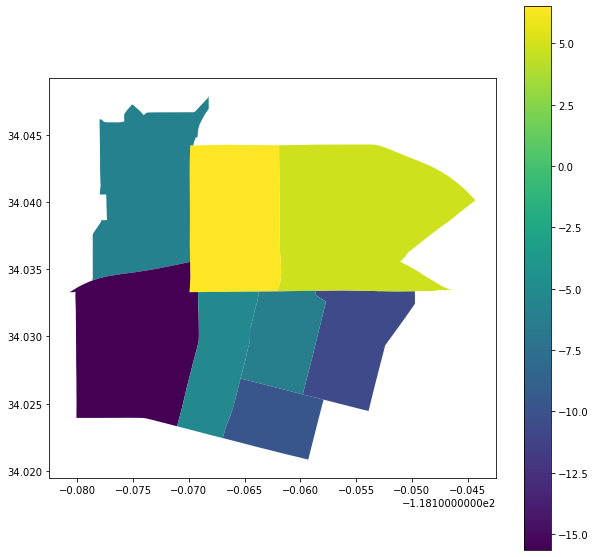

In [50]:
civic.plot(figsize=(10,10),
        column='% Change Foreign Born',
        legend=True)

In [51]:
civic_web_mercator = civic.to_crs(epsg=3857)

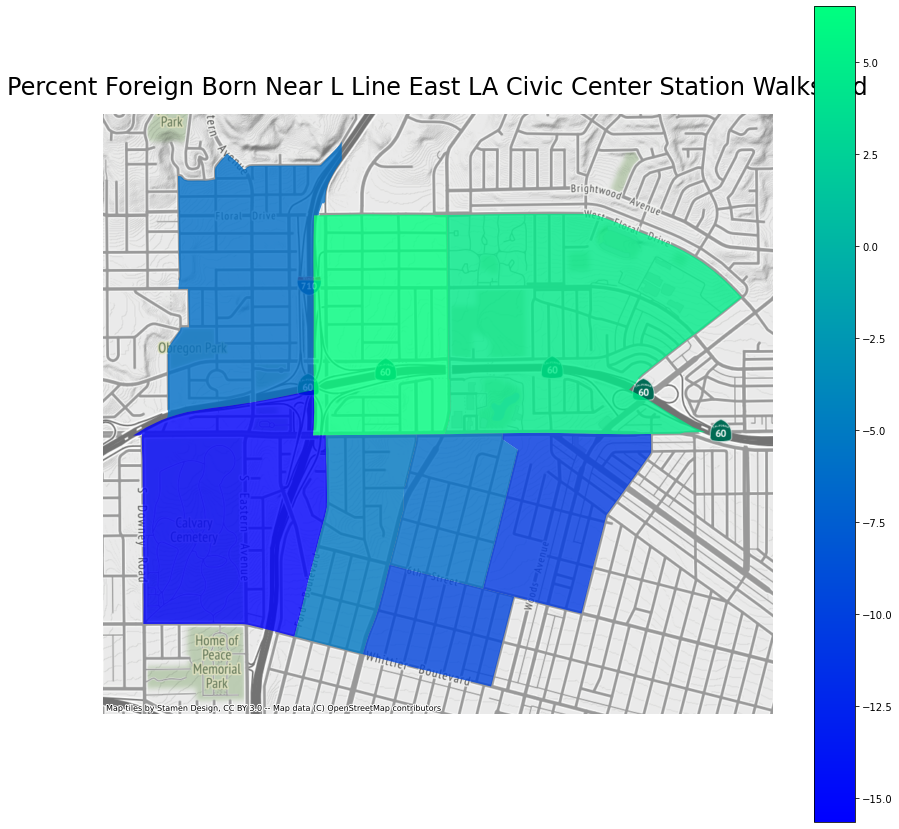

In [52]:
fig, ax = plt.subplots(figsize=(15, 15))
 
civic_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Foreign Born Near L Line East LA Civic Center Station Walkshed',fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.Terrain)

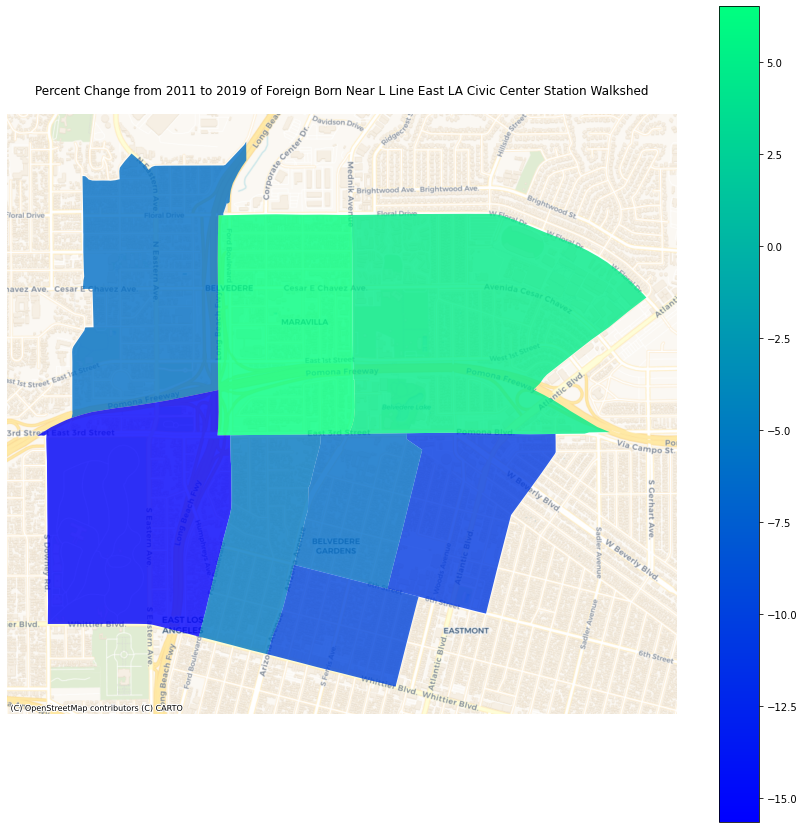

In [53]:
# Again, but with a new base map and updated title font size

fig, ax = plt.subplots(figsize=(15, 15))
 
civic_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Change from 2011 to 2019 of Foreign Born Near L Line East LA Civic Center Station Walkshed',fontsize=12, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

Okay, we're definitely able to create choropleths with this data. Now to write a function to run all our station areas. First, I will code a function and run it to see if it works. Then I will create a list with just the East LA Civic Center Station, write a for loop, and run it to see if it works. If everything looks good, I will finally add my other stations to the list and run it again - with the final outcome being a choropleth similar to the one we have above.

#### Station Area Chloropleth Function and For Loop

In [54]:
def stn_map(station = 'East LA Civic Center', column = '% Change Foreign Born'):
    
    #this station
    this_stn = gdf[gdf['station']==station]
                
    # plot it
    fig,ax = plt.subplots()
                
    ## ALSO, this was key! I could not get only the station area to plot until I changed the plot to this_stn.plot. 
    ## this is pulling only from the subset of interest, depending on what the loop is telling it
    this_stn.plot(ax=ax,
                column=column, 
                vmin=-15,
                vmax=15,
                legend=True)

#Updating the code so that the loop incorporates the correct station name into the title
    ax.axis('off')
    ax.set_title(station + ' Station' + ' % Change in Foreign Born Population', fontsize=14)

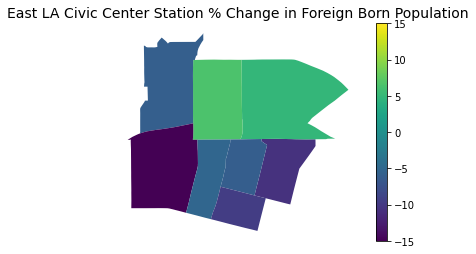

In [55]:
stn_map()

Now that we know the function works, let's create a list of all of our stations and run them through all through our function using a for loop.

In [56]:
stations = ['Arcadia', 'Del Mar', 'Highland Park', 'Heritage', 'Chinatown', 'Mariachi', 'East LA Civic Center']

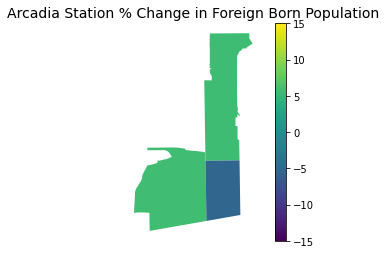

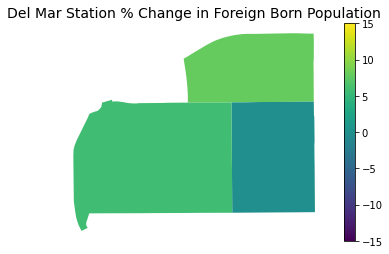

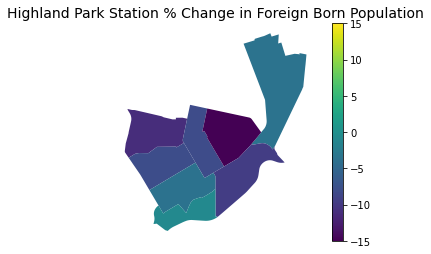

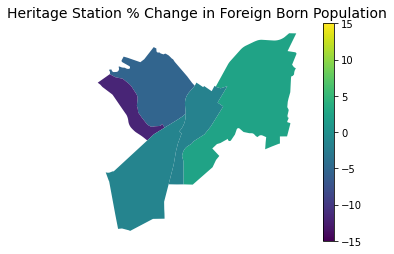

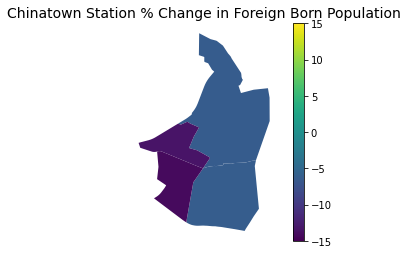

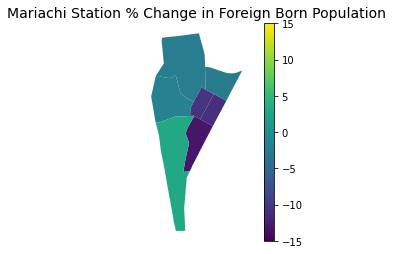

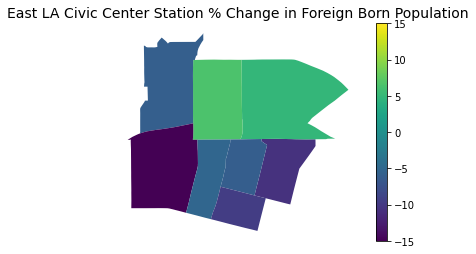

In [57]:
for station in stations:
    stn_map(station = station)

## Adding the basemap

In order to add a basemap, we have to project our gdf. 

In [58]:
gdf_web_mercator = gdf.to_crs(epsg=3857)

Now we update the code and use gdf_web_mercator to reflect our reflected gdf. 

In [59]:
def stn_map(station = 'East LA Civic Center', column = '% Change Foreign Born'):
    
    #this station
    this_stn = gdf_web_mercator[gdf_web_mercator['station']==station]
    
    # plot it
    fig,ax = plt.subplots(figsize=(12, 12))
                
    ## ALSO, this was key! I could not get only the station area to plot until I changed the plot to this_stn.plot. 
    ## this is pulling only from the subset of interest, depending on what the loop is telling it
    this_stn.plot(ax=ax,
                column=column, 
                vmin=-15,
                vmax=5,
                alpha=0.6,
                legend=True)
    
#Updating the code so that the loop incorporates the correct station name into the title
    ax.axis('off')
    
    ax.set_title(station + ' Station' + ' % Change in Foreign Born Population', fontsize=14)
    
    # this is the basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

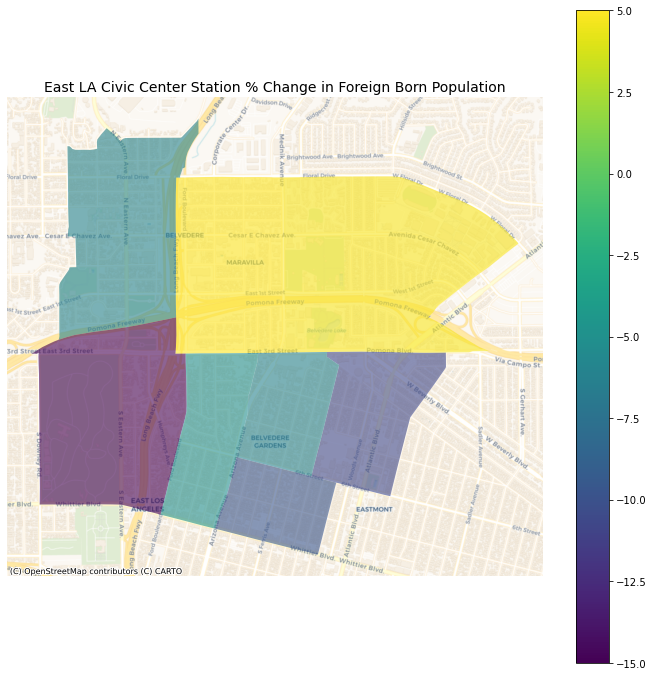

In [60]:
stn_map()

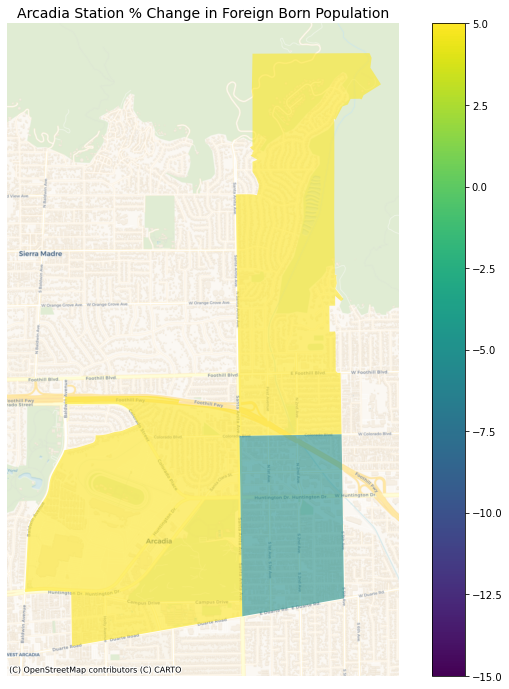

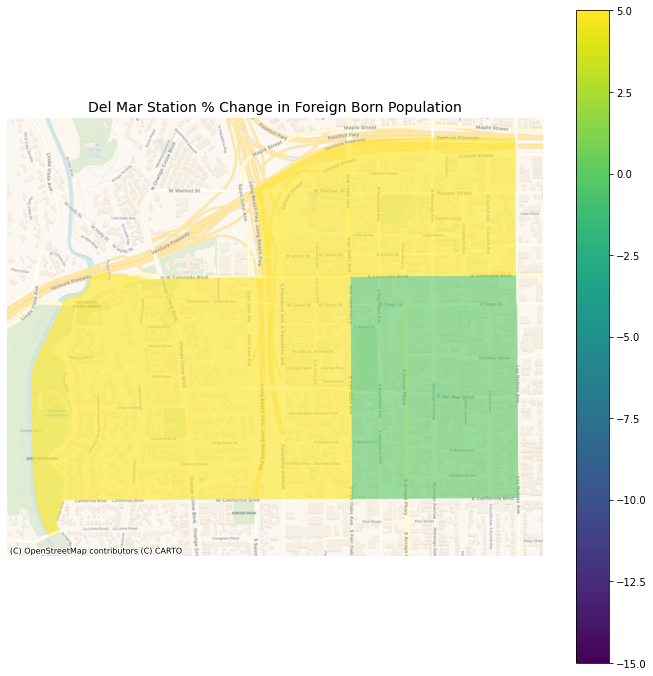

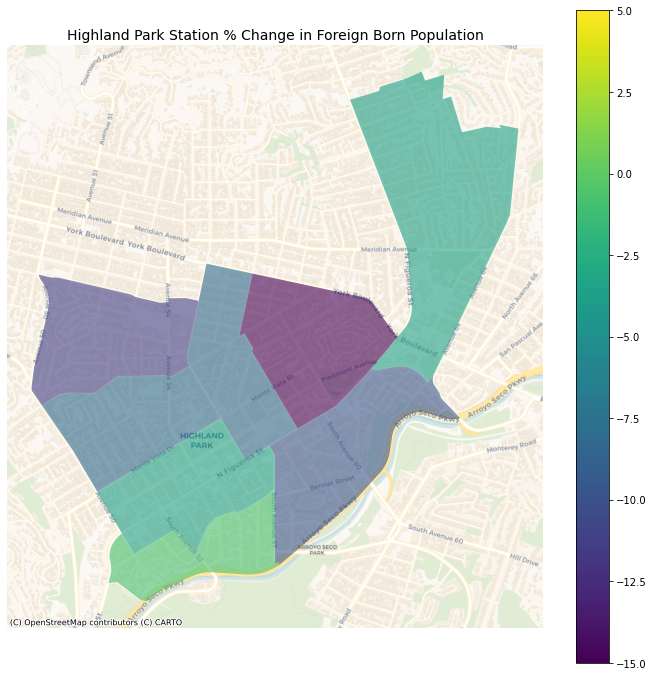

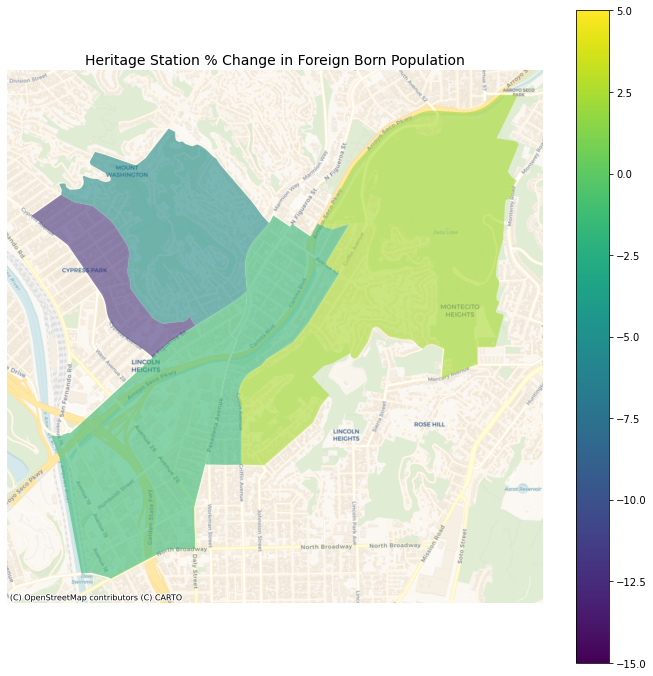

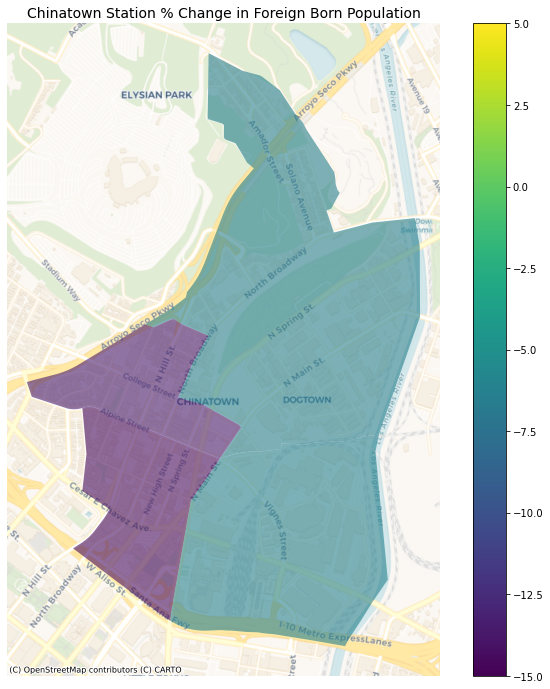

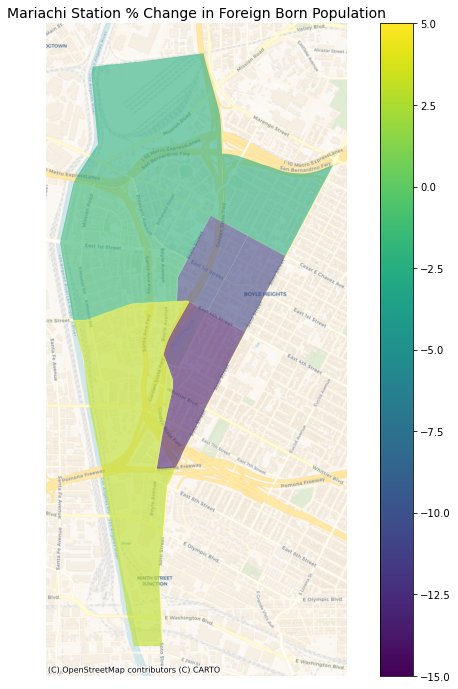

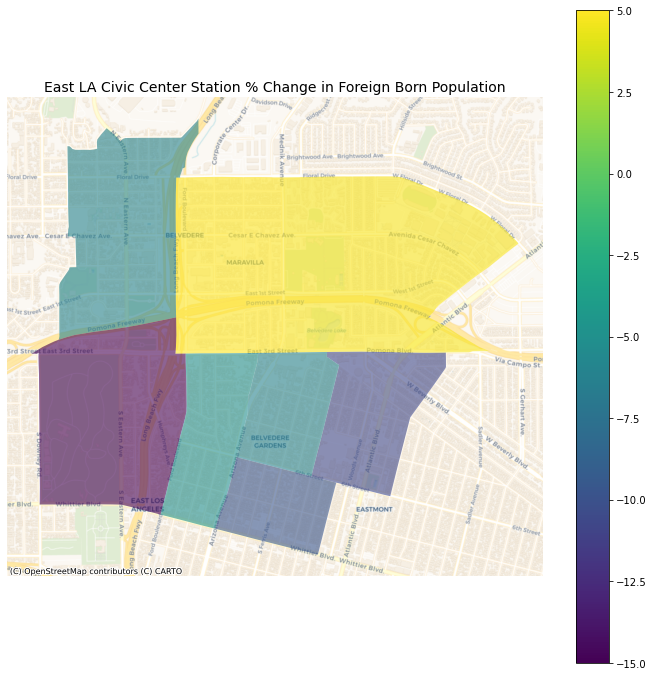

In [61]:
for station in stations:
    stn_map(station=station)

## Combining the Chloropleth and the Isochrone

When it came to for looping the isochrones and chloropleth maps through a function, we ran into some issues with showing the convex hull of our walkshed on top of the chloropleths. As a result, we ended up utilizing our station area maps from our midterm, which is shown in depth again below. We show the East LA Civic Center station process, but the same process applied to all stations.

In [123]:
civic = gdf[gdf["FIPS"].isin(['06037530400', 
                              '06037530301', 
                              '06037531603',
                              '06037531604',
                              '06037531504',
                              '06037531503',
                              '06037531000',
                              '06037530500']
                                    )
                     ]

In [124]:
civic.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Entered 2000 or later,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,...,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,% Change Foreign Born,region,station,geometry
180,06037530301,"Census Tract 5303.01, Los Angeles, CA",2389.0,1190.0,181.0,4.0,0.0,36.0,0.0,1150.0,...,54.0,0.0,9.0,0.0,0.0,0.0,-10.689068,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.15978 34.02568, -118.1595..."
182,06037530400,"Census Tract 5304, Los Angeles, CA",3427.0,1015.0,85.0,0.0,0.0,274.0,16.0,715.0,...,161.0,0.0,14.0,0.0,0.0,0.0,4.837387,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.16186 34.03384, -118.1617..."
183,06037530500,"Census Tract 5305, Los Angeles, CA",4555.0,1560.0,327.0,1.0,0.0,0.0,0.0,1557.0,...,181.0,18.0,0.0,0.0,12.0,0.0,6.515567,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.16991 34.03369, -118.1698..."
191,06037531000,"Census Tract 5310, Los Angeles, CA",5219.0,2134.0,434.0,9.0,0.0,0.0,0.0,2124.0,...,135.0,0.0,9.0,0.0,0.0,0.0,-6.016665,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.17866 34.03421, -118.1786..."
198,06037531503,"Census Tract 5315.03, Los Angeles, CA",3651.0,1826.0,600.0,0.0,0.0,0.0,0.0,1826.0,...,109.0,0.0,0.0,0.0,0.0,0.0,-15.651181,East LA,East LA Civic Center,"MULTIPOLYGON (((-118.18047 34.03340, -118.1804..."


<AxesSubplot:>

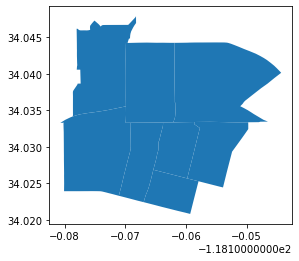

In [125]:
civic.plot()

There's our census tracts. Let's add some statistics to these census tracts. 

<AxesSubplot:>

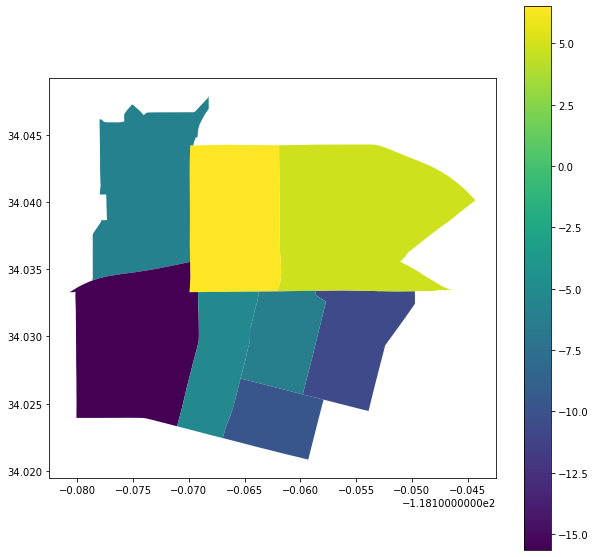

In [126]:
civic.plot(figsize=(10,10),
        column='% Change Foreign Born',
        legend=True)

In [127]:
civic_web_mercator = civic.to_crs(epsg=3857)

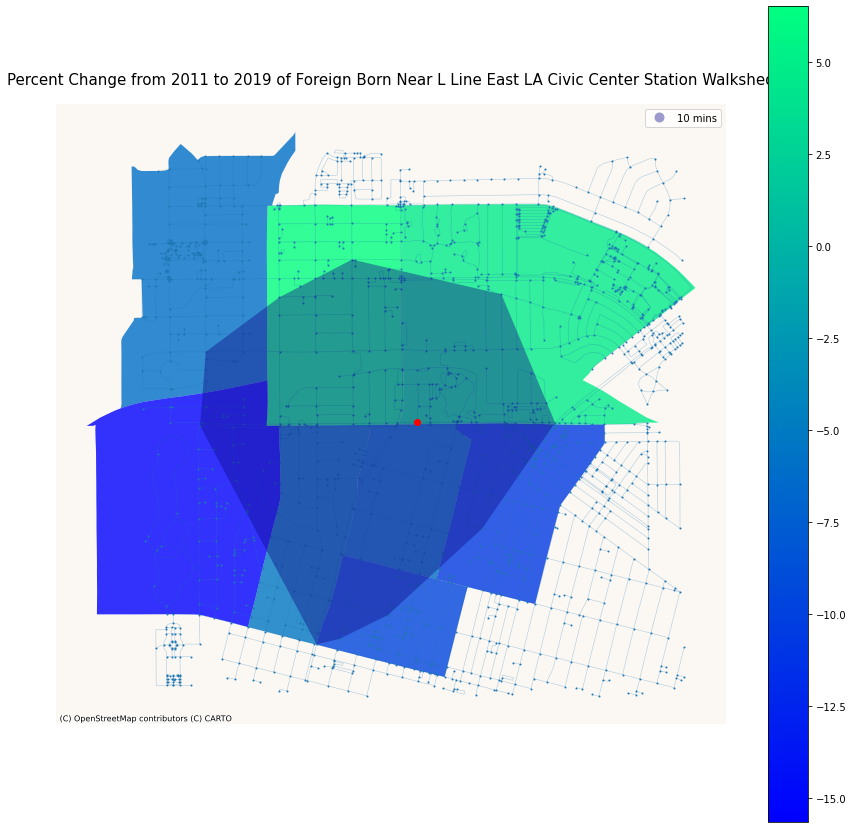

In [128]:
fig, ax = plt.subplots(figsize=(15, 15))
 
civic_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8,
                    cmap="winter")

# add the isochrones
isochrones_civic.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node1]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

ax.axis('off')

ax.set_title('Percent Change from 2011 to 2019 of Foreign Born Near L Line East LA Civic Center Station Walkshed',fontsize=15, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager, zoom=3)

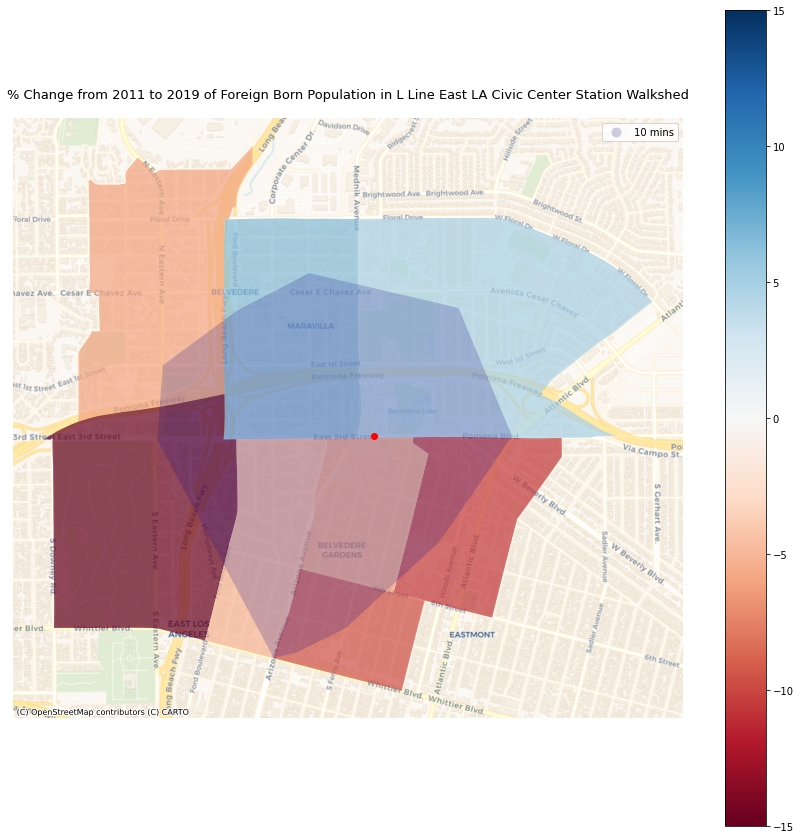

In [129]:
# adding a new max, min, color and deleting nodes and edges

fig, ax = plt.subplots(figsize=(15, 15))
 
civic_web_mercator.plot(
                    column='% Change Foreign Born',
                    ax=ax, 
                    legend=True,
                    vmin=-15,
                    vmax=15,
                    alpha=0.7,
                    cmap="RdBu")


# add the isochrones
isochrones_civic.plot(alpha=0.2, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node1]].plot(ax=ax,color='r', zorder=30)

ax.axis('off')

ax.set_title('% Change from 2011 to 2019 of Foreign Born Population in L Line East LA Civic Center Station Walkshed',fontsize=13, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

plt.savefig("CivicStation_ForeignBorn.jpg")

## Interactive Map for All Stations and Regions

## Creating Charts Using Plotly

In order to create a comparison bar chart that has all station areas and regions on the same axis, we have to create a new dataframe by concatenating all of the summation rows from each station area or region. For brevity sake, we just do one as an example below, and then import the concatenated dataframe that as been completed on a separate notebook.

In [62]:
df = gdf

In [63]:
df.head()

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Entered 2000 or later,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,...,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,% Change Foreign Born,region,station,geometry
0,06037181000,"Census Tract 1810, Los Angeles, CA",6574.0,2172.0,161.0,88.0,0.0,1039.0,137.0,941.0,...,99.0,0.0,113.0,0.0,15.0,0.0,-5.569441,NELA,None,"MULTIPOLYGON (((-118.22860 34.14689, -118.2285..."
1,06037181300,"Census Tract 1813, Los Angeles, CA",3860.0,1428.0,188.0,77.0,8.0,845.0,144.0,491.0,...,77.0,0.0,43.0,0.0,57.0,0.0,-4.277401,NELA,None,"MULTIPOLYGON (((-118.22942 34.13411, -118.2294..."
2,06037181400,"Census Tract 1814, Los Angeles, CA",4832.0,2026.0,625.0,89.0,9.0,1160.0,303.0,775.0,...,66.0,0.0,150.0,40.0,46.0,25.0,-0.880861,NELA,None,"MULTIPOLYGON (((-118.21897 34.14000, -118.2173..."
3,06037181500,"Census Tract 1815, Los Angeles, CA",4035.0,1683.0,183.0,113.0,30.0,806.0,101.0,762.0,...,277.0,0.0,122.0,0.0,19.0,0.0,-10.516913,NELA,None,"MULTIPOLYGON (((-118.20153 34.13351, -118.2015..."
4,06037181600,"Census Tract 1816, Los Angeles, CA",4425.0,1125.0,278.0,49.0,27.0,369.0,154.0,675.0,...,126.0,0.0,44.0,11.0,64.0,17.0,2.453619,NELA,None,"MULTIPOLYGON (((-118.21828 34.13188, -118.2181..."


In [64]:
ctk = ['station', '% Change Foreign Born']

In [65]:
elacc = df[df["station"].isin(['East LA Civic Center']
)
            ]

elacc.reset_index()

elacc = elacc.append(elacc.sum(numeric_only=True), ignore_index=True)

elacc.iloc[-1, elacc.columns.get_loc('station')] = "East LA Civic Center"

elacc = elacc.iloc[-1:]

elacc['% Change Foreign Born'] = ((elacc['19 Total Foreign Born'] / elacc['19 Total Population']) - (elacc['11 Total Foreign Born'] / elacc['11 Total Population']))*100

elacc = elacc[ctk]

elacc.head()



,station,% Change Foreign Born
8,East LA Civic Center,-4.862695


We did this for each station and region, and obtained the following dataframe:

In [83]:
chart = pd.read_csv('comparisongraphchart.csv')

In [84]:
chart

,Unnamed: 0,Station,% Change Foreign Born,Area
0,0,East LA Civic Center,-4.862695,Station
1,1,East LA Civic Center,-3.315136,Region
2,2,Mariachi,-5.466961,Station
3,3,Mariachi,-3.315136,Region
4,4,Chinatown,-7.647560,Station
5,5,Chinatown,-8.024850,Region
6,6,Heritage,-2.705435,Station
7,7,Heritage,-4.875099,Region
8,8,Highland Park,-7.117768,Station
9,9,Highland Park,-4.875099,Region


In [85]:
chart.drop(columns = ['Unnamed: 0'])

,Station,% Change Foreign Born,Area
0,East LA Civic Center,-4.862695,Station
1,East LA Civic Center,-3.315136,Region
2,Mariachi,-5.466961,Station
3,Mariachi,-3.315136,Region
4,Chinatown,-7.647560,Station
5,Chinatown,-8.024850,Region
6,Heritage,-2.705435,Station
7,Heritage,-4.875099,Region
8,Highland Park,-7.117768,Station
9,Highland Park,-4.875099,Region


Using this new and rearranged dataframe, we create a plotly graph

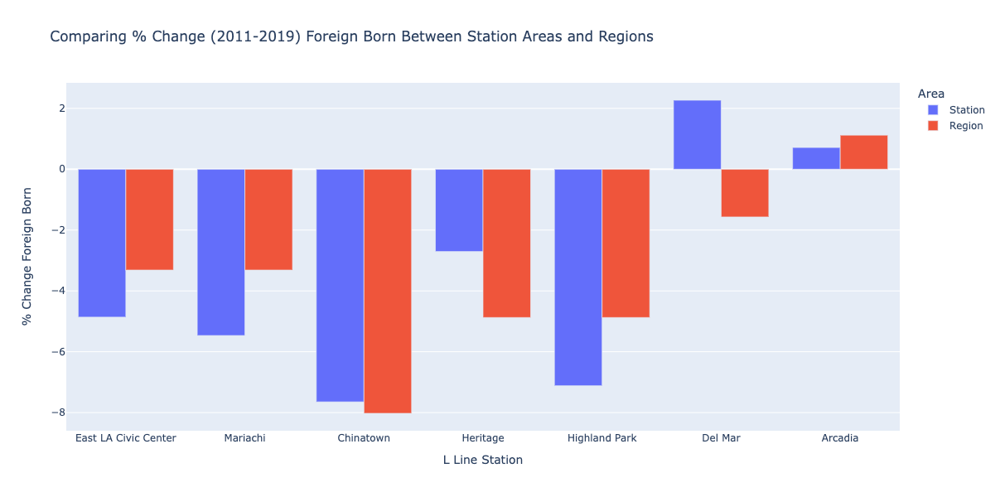

In [89]:
fig = px.bar(chart, x='Station', y='% Change Foreign Born',
             barmode='group', 
             title='Comparing % Change (2011-2019) Foreign Born Between Station Areas and Regions',
             color='Area',  
             width=1000, 
             height=600)

fig.update_layout(xaxis_title="L Line Station")
fig.show()

fig.write_html("Stn_Rgn_Compare_Chart.html")

### Station and Region Ethnic Breakdown Charts

In an effort to help explain some of the discrepancies we see among station areas and regions in the graph above, we wanted to take a closer look at the ethnic make up of each station area and region. Below, we create a function and for loop to create all 12 of our charts for us. This way we can take a look at all our data to look for a narrative.
<br>
<br>
We first create 2 lists to differentiate our stations and regions

In [78]:
stations = ['East LA Civic Center', 'Mariachi', 'Chinatown', 'Heritage', 'Highland Park', 'Del Mar', 'Arcadia']

regions = ['East LA', 'Central LA', 'NELA', 'Pasadena', 'San Gabriel Valley']

We then create functions and for loops to create charts to show ethnic breakdown by station and region, as well as percent change from 2011-2019 in foreign population as a share of total population. 

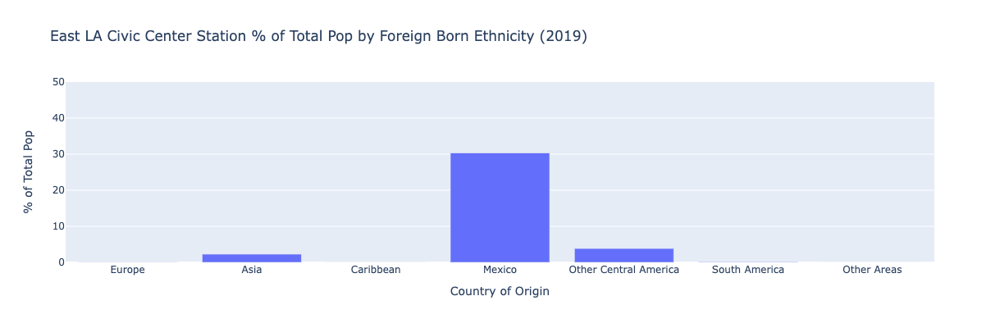

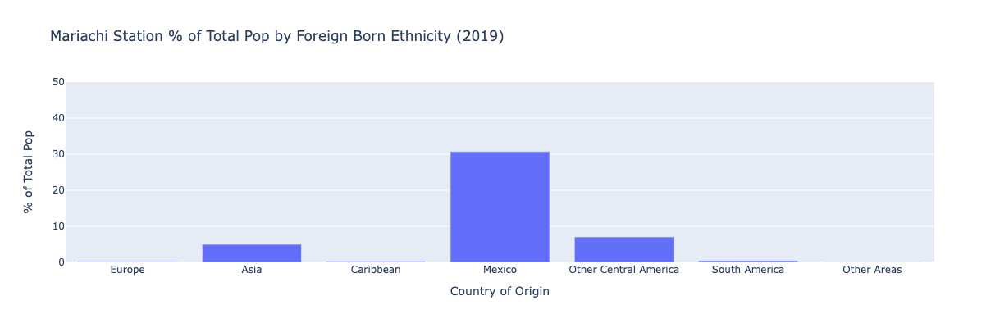

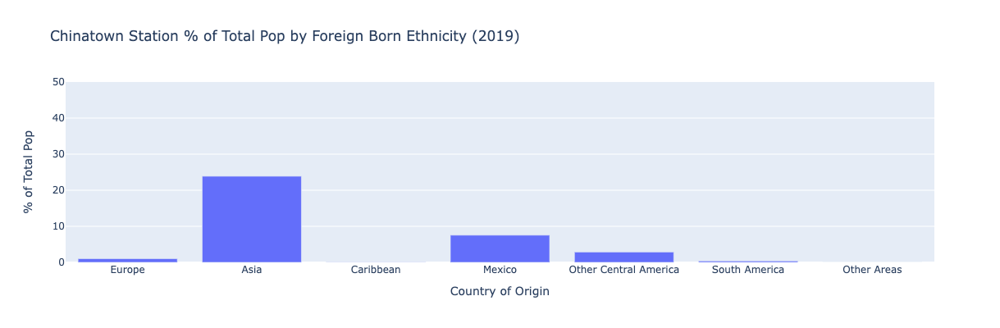

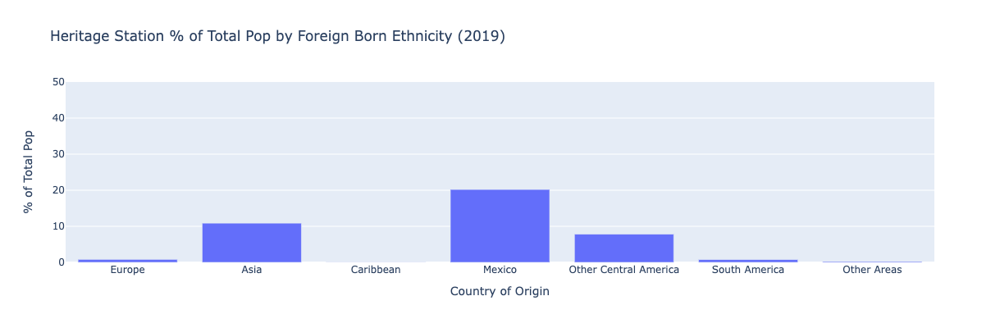

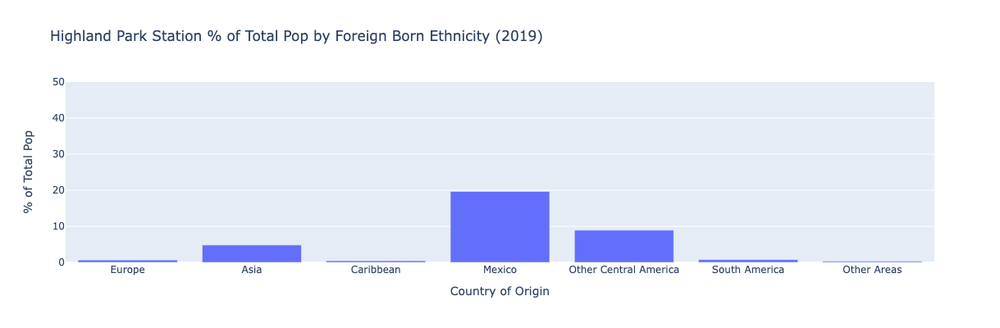

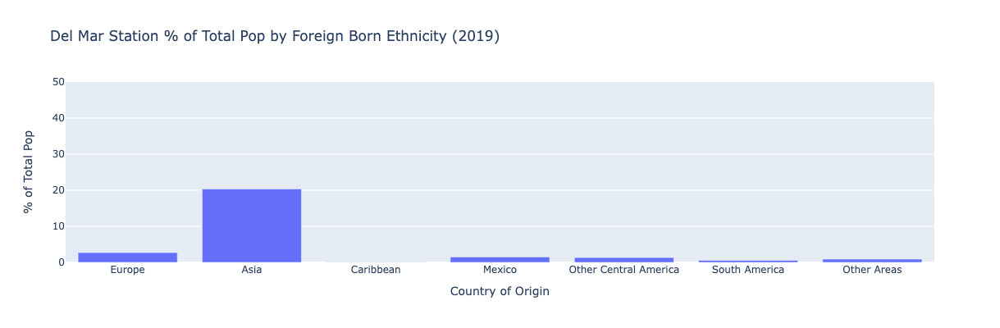

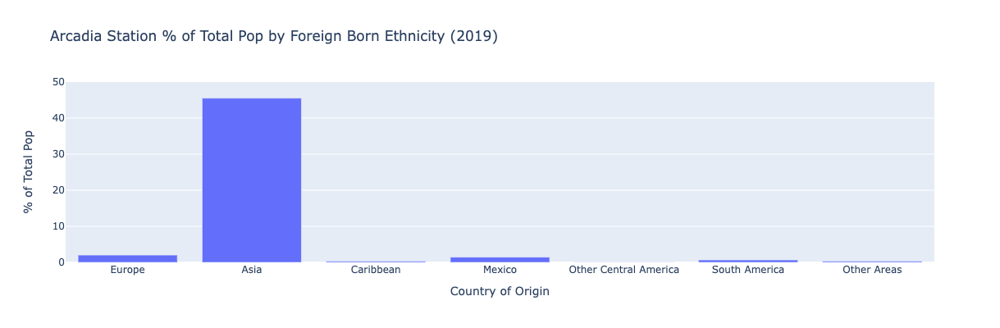

In [73]:
def stn_chart_country(station = 'East LA Civic Center'):

    gdf = df[df["station"].isin([station])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = gdf['19 Europe']/gdf['19 Total Population']*100
    gdf['Asia'] = gdf['19 Asia']/gdf['19 Total Population']*100
    gdf['Caribbean'] = gdf['19 Caribbean']/gdf['19 Total Population']*100
    gdf['Mexico'] = gdf['19 Mexico']/gdf['19 Total Population']*100
    gdf['Other Central America'] = gdf['19 Other Central America']/gdf['19 Total Population']*100
    gdf['South America'] = gdf['19 South America']/gdf['19 Total Population']*100
    gdf['Other Areas'] = gdf['19 Other Areas Entered 2010 or later']/gdf['19 Total Population']*100
    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% of Total Pop']
    
    fig = px.bar(gdf, x='Country of Origin', y='% of Total Pop',
              barmode='group',
              title=station + " Station % of Total Pop by Foreign Born Ethnicity (2019)", 
              height=400)
    
    fig.update_yaxes(range=[0, 50])
   
    fig.show()

for station in stations:
    stn_chart_country(station = station)

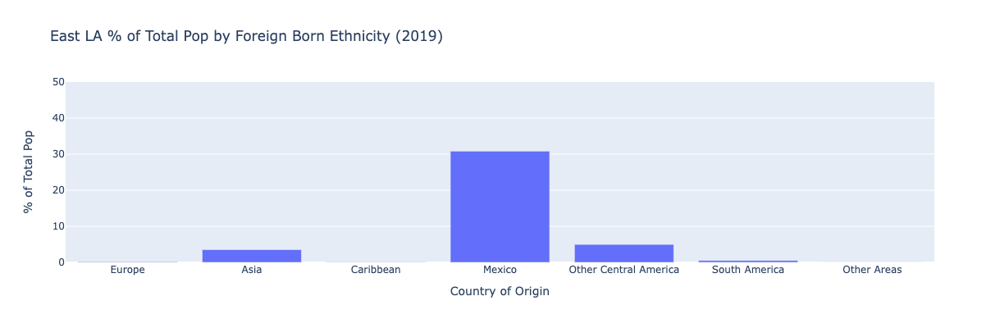

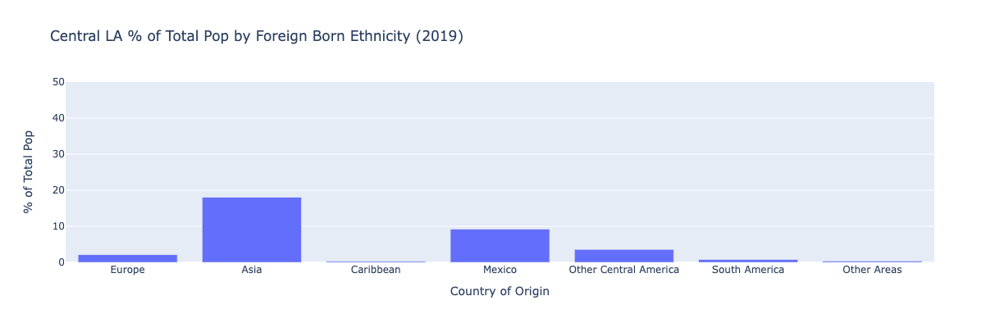

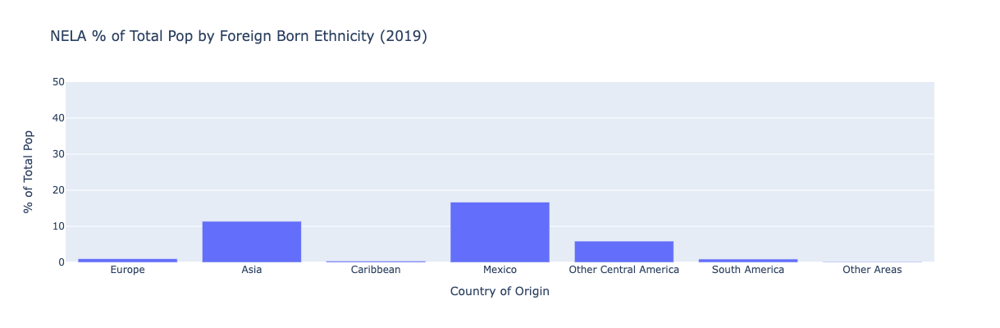

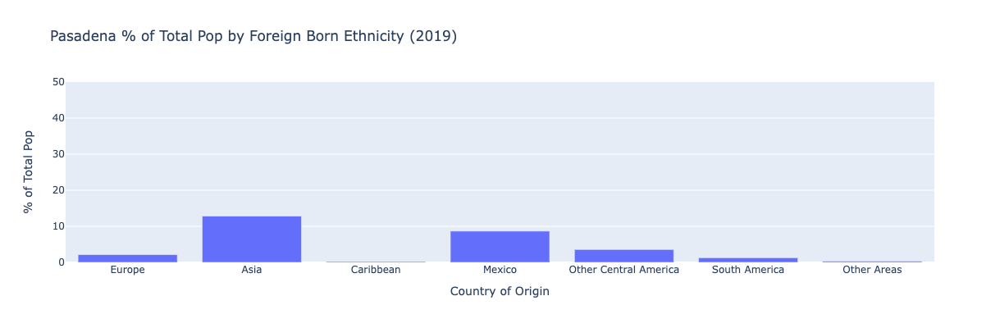

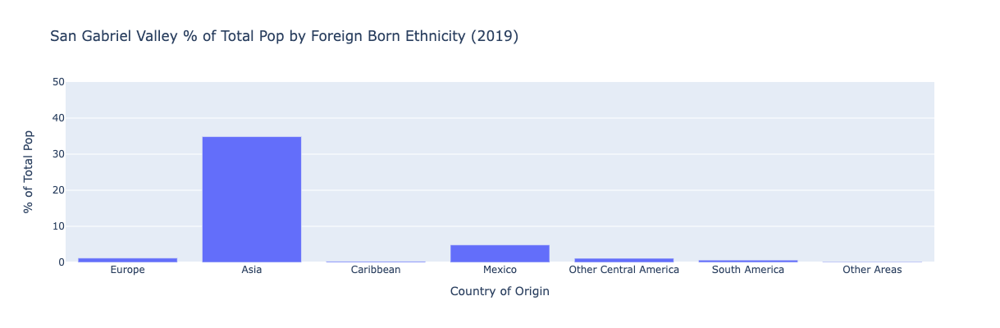

In [79]:
def rgn_chart_country(region = 'East LA'):

    gdf = df[df["region"].isin([region])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = gdf['19 Europe']/gdf['19 Total Population']*100
    gdf['Asia'] = gdf['19 Asia']/gdf['19 Total Population']*100
    gdf['Caribbean'] = gdf['19 Caribbean']/gdf['19 Total Population']*100
    gdf['Mexico'] = gdf['19 Mexico']/gdf['19 Total Population']*100
    gdf['Other Central America'] = gdf['19 Other Central America']/gdf['19 Total Population']*100
    gdf['South America'] = gdf['19 South America']/gdf['19 Total Population']*100
    gdf['Other Areas'] = gdf['19 Other Areas Entered 2010 or later']/gdf['19 Total Population']*100
    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
   # Renaming columns
    gdf.columns = ['Country of Origin', '% of Total Pop']
    
    fig = px.bar(gdf, x='Country of Origin', y='% of Total Pop',
              barmode='group',
              title=region + " % of Total Pop by Foreign Born Ethnicity (2019)", 
              height=400)
    
    fig.update_yaxes(range=[0, 50])
   
    fig.show()

for region in regions:
    rgn_chart_country(region = region)

Showing the ethnicity breakdown is good, but let's also show the percentage change of foreign born residents from 2011 to 2019 for each of our stations and regions.

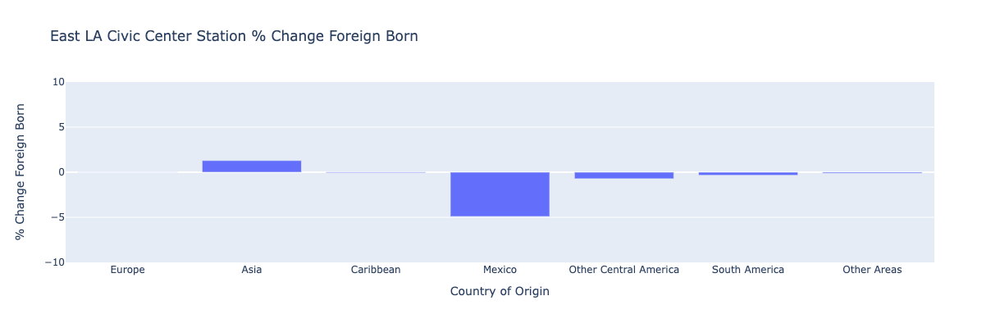

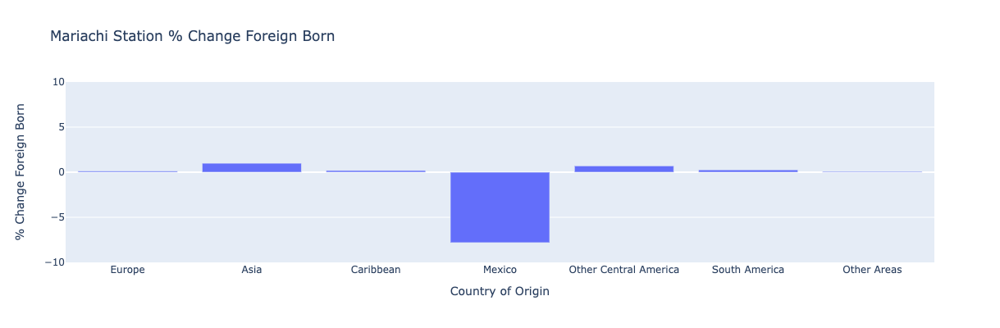

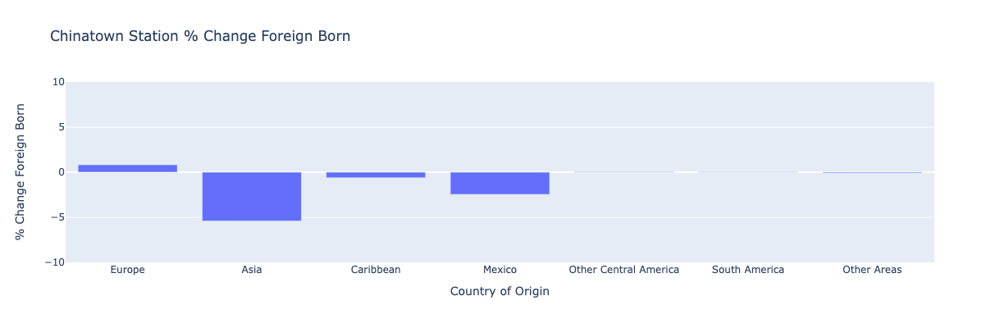

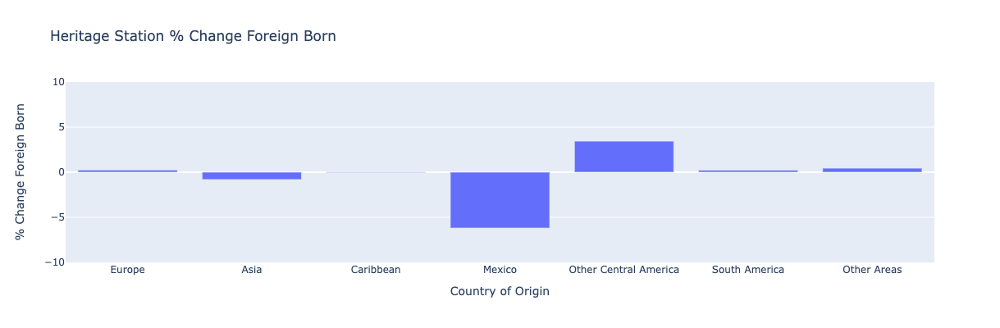

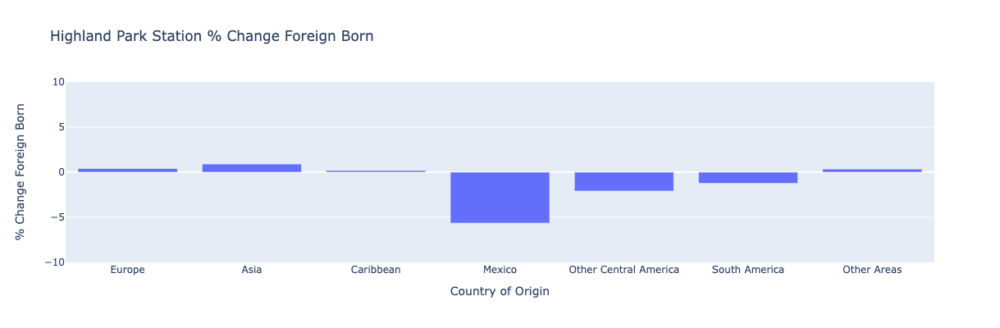

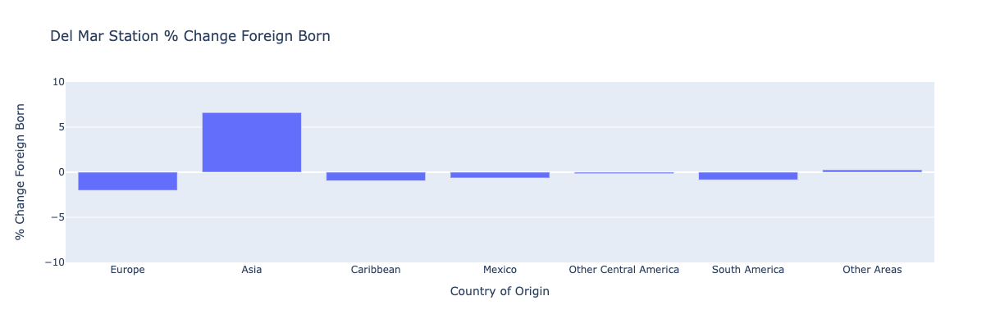

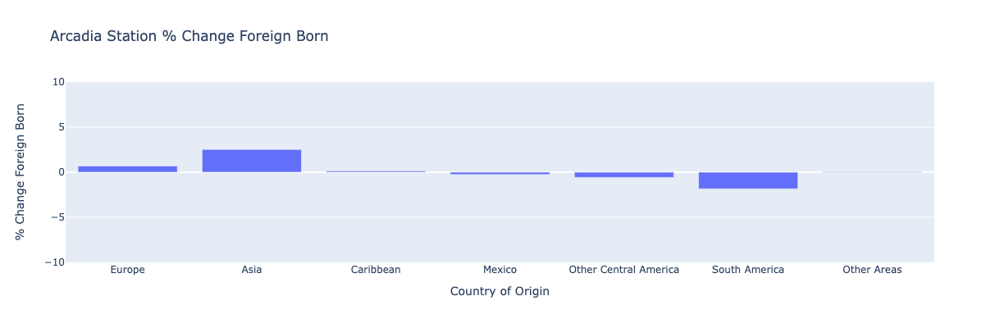

In [75]:
def stn_chart_percent(station = 'East LA Civic Center'):

    gdf = df[df["station"].isin([station])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = ((gdf['19 Europe']/gdf['19 Total Population']) - (gdf['11 Europe']/gdf['11 Total Population'])) * 100
    gdf['Asia'] = ((gdf['19 Asia']/gdf['19 Total Population']) - (gdf['11 Asia']/gdf['11 Total Population'])) * 100
    gdf['Caribbean'] = ((gdf['19 Caribbean']/gdf['19 Total Population']) - (gdf['11 Caribbean']/gdf['11 Total Population']))*100
    gdf['Mexico'] = ((gdf['19 Mexico']/gdf['19 Total Population']) - (gdf['11 Mexico']/gdf['11 Total Population']))*100
    gdf['Other Central America'] = ((gdf['19 Other Central America']/gdf['19 Total Population']) - (gdf['11 Other Central America']/gdf['11 Total Population']))*100
    gdf['South America'] = ((gdf['19 South America']/gdf['19 Total Population']) - (gdf['11 South America']/gdf['11 Total Population']))*100
    gdf['Other Areas'] = ((gdf['19 Other Areas']/gdf['19 Total Population']) - (gdf['11 Other areas']/gdf['11 Total Population']))*100


    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% Change Foreign Born']
    
    fig = px.bar(gdf, x='Country of Origin', y='% Change Foreign Born',
              barmode='group',
              title=station + " Station % Change Foreign Born", 
              height=400)
    
    fig.update_yaxes(range=[-10, 10])
   
    fig.show()

for station in stations:
    stn_chart_percent(station = station)

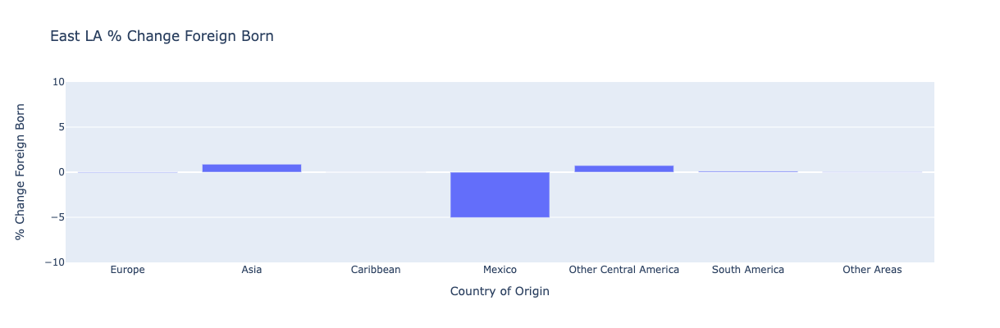

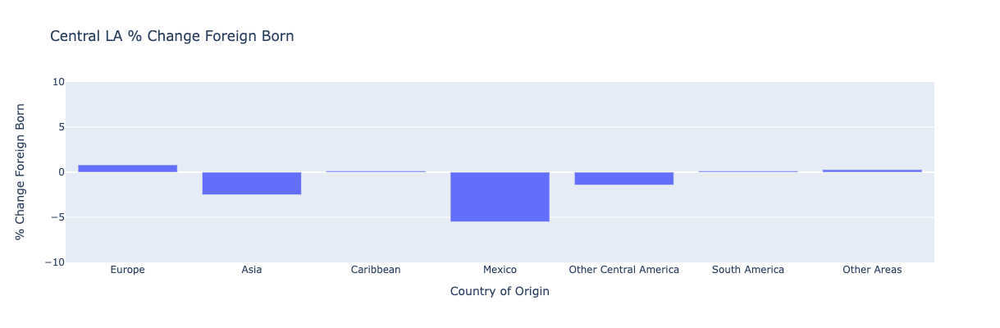

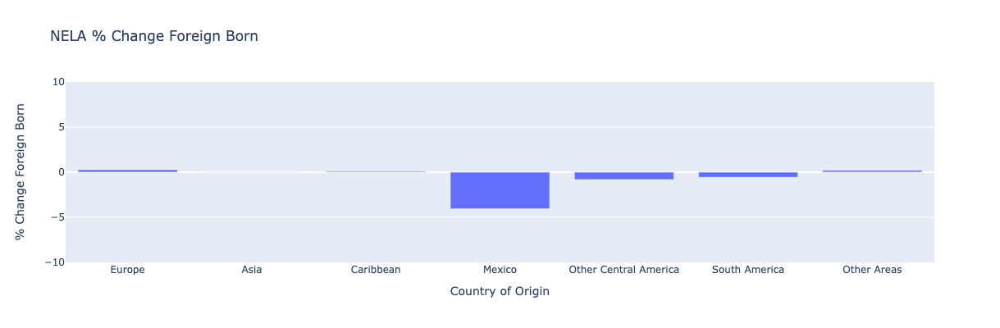

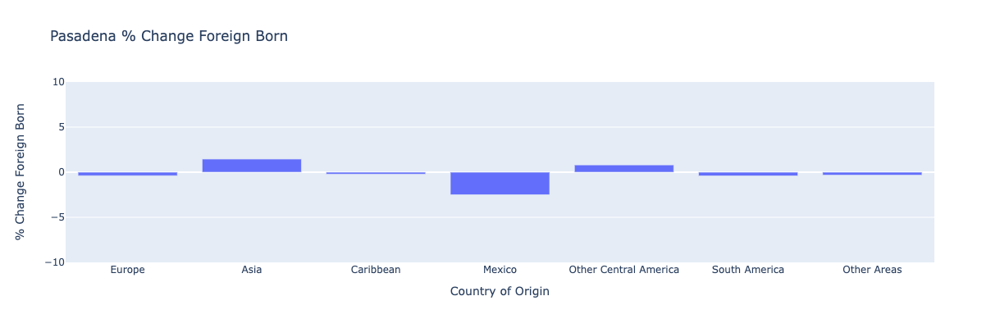

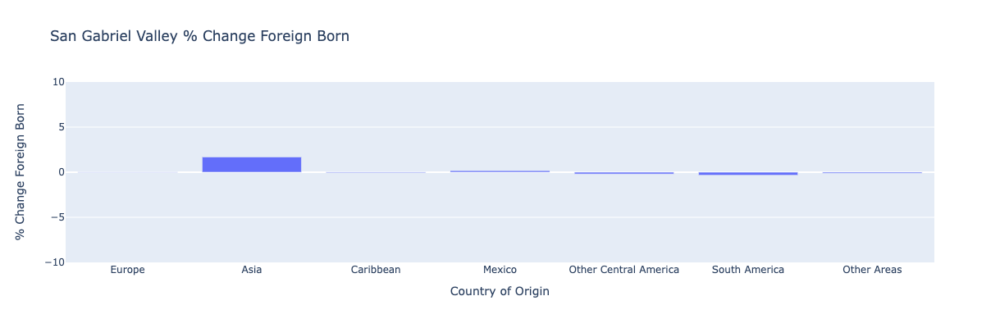

In [80]:
def rgn_chart_percent(region = 'East LA'):

    gdf = df[df["region"].isin([region])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = ((gdf['19 Europe']/gdf['19 Total Population']) - (gdf['11 Europe']/gdf['11 Total Population'])) * 100
    gdf['Asia'] = ((gdf['19 Asia']/gdf['19 Total Population']) - (gdf['11 Asia']/gdf['11 Total Population'])) * 100
    gdf['Caribbean'] = ((gdf['19 Caribbean']/gdf['19 Total Population']) - (gdf['11 Caribbean']/gdf['11 Total Population']))*100
    gdf['Mexico'] = ((gdf['19 Mexico']/gdf['19 Total Population']) - (gdf['11 Mexico']/gdf['11 Total Population']))*100
    gdf['Other Central America'] = ((gdf['19 Other Central America']/gdf['19 Total Population']) - (gdf['11 Other Central America']/gdf['11 Total Population']))*100
    gdf['South America'] = ((gdf['19 South America']/gdf['19 Total Population']) - (gdf['11 South America']/gdf['11 Total Population']))*100
    gdf['Other Areas'] = ((gdf['19 Other Areas']/gdf['19 Total Population']) - (gdf['11 Other areas']/gdf['11 Total Population']))*100


    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% Change Foreign Born']
    
    fig = px.bar(gdf, x='Country of Origin', y='% Change Foreign Born',
              barmode='group',
              title=region + " % Change Foreign Born", 
              height=400)
    
    fig.update_yaxes(range=[-10, 10])
   
    fig.show()

for region in regions:
    rgn_chart_percent(region = region)

After analyzing these charts alongside our chloropleth maps, we were able to select out a few stations to investigate further. We selected Highland Park, Chinatown, and Del Mar station, as they each exhibited a unique trend in the data that we discuss further in our Story Map.
<br>
<br>
We created new functions to write charts to html files so viewers of our charts on our Story Map can hover to view stats.

In [109]:
def stn_chart_percent_html(station = 'East LA Civic Center'):

    gdf = df[df["station"].isin([station])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = ((gdf['19 Europe']/gdf['19 Total Population']) - (gdf['11 Europe']/gdf['11 Total Population'])) * 100
    gdf['Asia'] = ((gdf['19 Asia']/gdf['19 Total Population']) - (gdf['11 Asia']/gdf['11 Total Population'])) * 100
    gdf['Caribbean'] = ((gdf['19 Caribbean']/gdf['19 Total Population']) - (gdf['11 Caribbean']/gdf['11 Total Population']))*100
    gdf['Mexico'] = ((gdf['19 Mexico']/gdf['19 Total Population']) - (gdf['11 Mexico']/gdf['11 Total Population']))*100
    gdf['Other Central America'] = ((gdf['19 Other Central America']/gdf['19 Total Population']) - (gdf['11 Other Central America']/gdf['11 Total Population']))*100
    gdf['South America'] = ((gdf['19 South America']/gdf['19 Total Population']) - (gdf['11 South America']/gdf['11 Total Population']))*100
    gdf['Other Areas'] = ((gdf['19 Other Areas']/gdf['19 Total Population']) - (gdf['11 Other areas']/gdf['11 Total Population']))*100


    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% Change Foreign Born']
    
    fig = px.bar(gdf, x='Country of Origin', y='% Change Foreign Born',
              barmode='group',
              title=station + " Station % Change Foreign Born (2011-2019)", 
              height=400)
    
    fig.update_yaxes(range=[-10, 10])
    
    fig.write_html(station + "_Percent_Chart.html")
    
    fig.show()

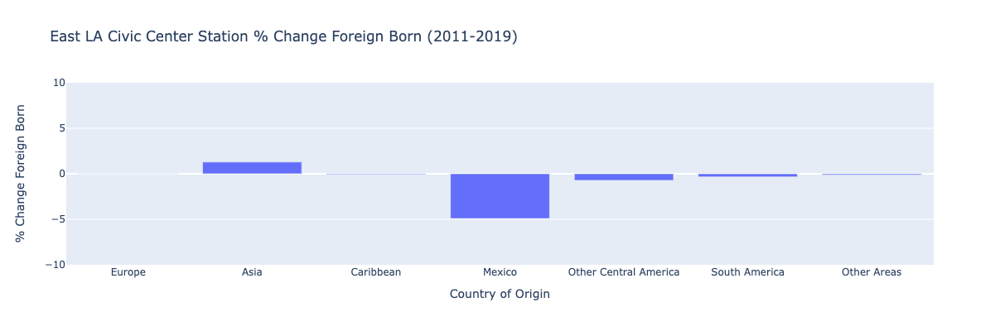

In [110]:
stn_chart_percent_html('East LA Civic Center')

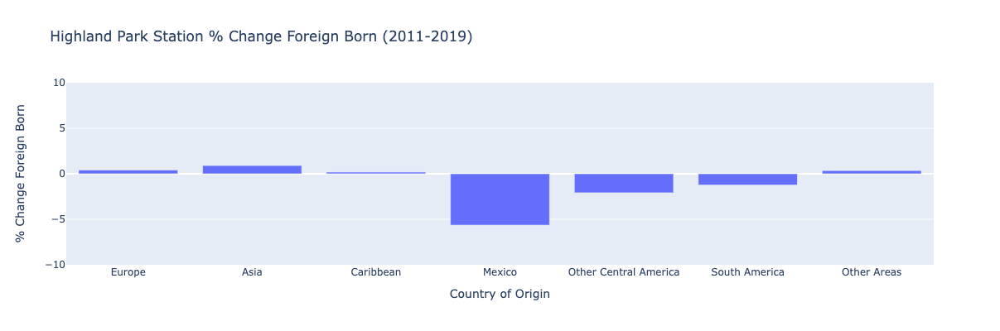

In [111]:
stn_chart_percent_html('Highland Park')

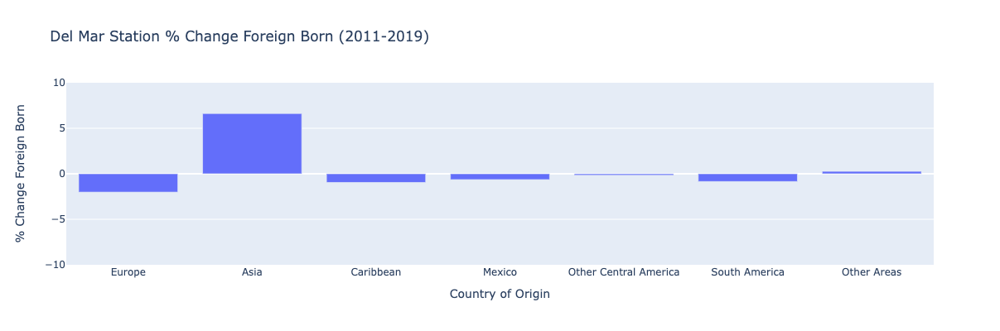

In [112]:
stn_chart_percent_html('Del Mar')

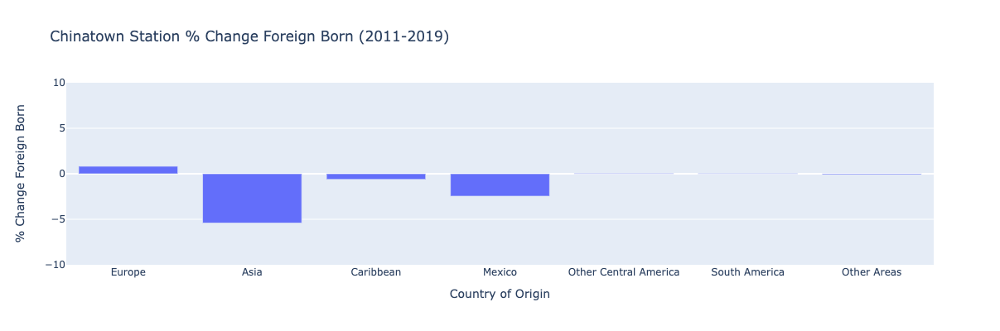

In [113]:
stn_chart_percent_html('Chinatown')

In [114]:
def rgn_chart_percent_html(region = 'East LA'):

    gdf = df[df["region"].isin([region])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = ((gdf['19 Europe']/gdf['19 Total Population']) - (gdf['11 Europe']/gdf['11 Total Population'])) * 100
    gdf['Asia'] = ((gdf['19 Asia']/gdf['19 Total Population']) - (gdf['11 Asia']/gdf['11 Total Population'])) * 100
    gdf['Caribbean'] = ((gdf['19 Caribbean']/gdf['19 Total Population']) - (gdf['11 Caribbean']/gdf['11 Total Population']))*100
    gdf['Mexico'] = ((gdf['19 Mexico']/gdf['19 Total Population']) - (gdf['11 Mexico']/gdf['11 Total Population']))*100
    gdf['Other Central America'] = ((gdf['19 Other Central America']/gdf['19 Total Population']) - (gdf['11 Other Central America']/gdf['11 Total Population']))*100
    gdf['South America'] = ((gdf['19 South America']/gdf['19 Total Population']) - (gdf['11 South America']/gdf['11 Total Population']))*100
    gdf['Other Areas'] = ((gdf['19 Other Areas']/gdf['19 Total Population']) - (gdf['11 Other areas']/gdf['11 Total Population']))*100


    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% Change Foreign Born']
    
    fig = px.bar(gdf, x='Country of Origin', y='% Change Foreign Born',
              barmode='group',
              title=region + " % Change Foreign Born (2011-2019)", 
              height=400)
    
    fig.update_yaxes(range=[-10, 10])
   
    fig.show()
    
    fig.write_html(region+ "_Percent_Chart.html")

In [115]:
crit_stns = ['Highland Park', 'Del Mar', 'Chinatown']

In [116]:
crit_rgns = ['NELA', 'Pasadena', 'Central LA']

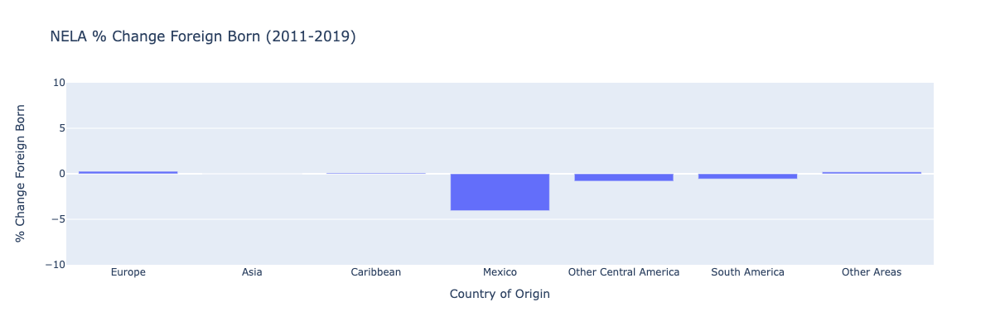

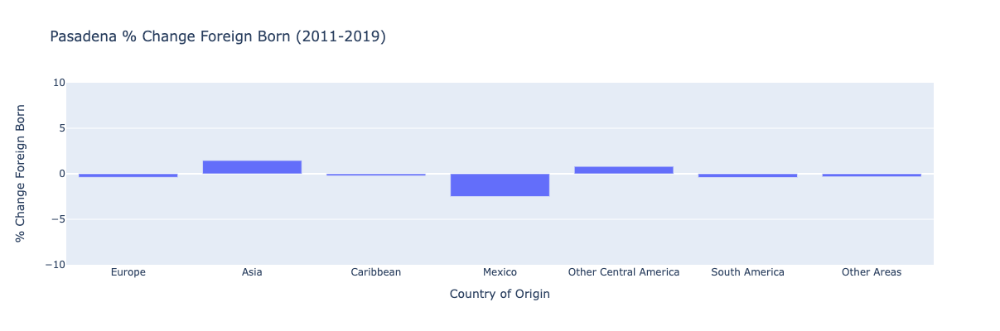

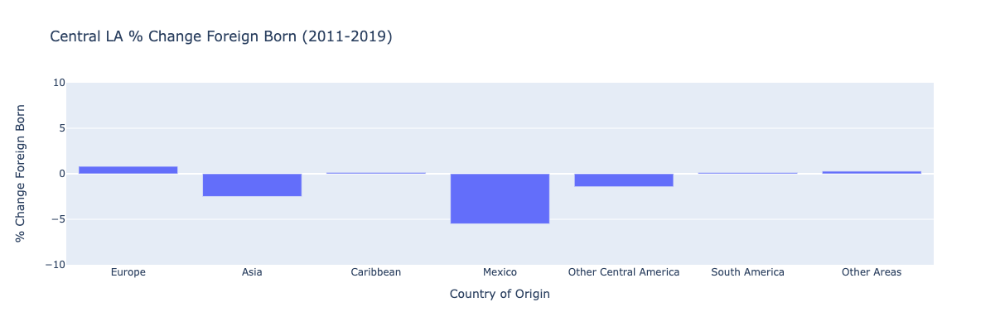

In [117]:
for crit_rgn in crit_rgns:
    rgn_chart_percent_html(region = crit_rgn)

In [121]:
def stn_chart_country_html(station = 'East LA Civic Center'):

    gdf = df[df["station"].isin([station])]

    # Creating our summation row, since we're not breaking it down by census tract
    gdf = gdf.append(gdf.sum(numeric_only=True), ignore_index=True)

    # Keeping only summation row
    gdf = gdf.iloc[-1:]
    
    gdf = gdf.drop(columns=['FIPS', 'Census Tract'], axis=1)

    gdf['Europe'] = gdf['19 Europe']/gdf['19 Total Population']*100
    gdf['Asia'] = gdf['19 Asia']/gdf['19 Total Population']*100
    gdf['Caribbean'] = gdf['19 Caribbean']/gdf['19 Total Population']*100
    gdf['Mexico'] = gdf['19 Mexico']/gdf['19 Total Population']*100
    gdf['Other Central America'] = gdf['19 Other Central America']/gdf['19 Total Population']*100
    gdf['South America'] = gdf['19 South America']/gdf['19 Total Population']*100
    gdf['Other Areas'] = gdf['19 Other Areas Entered 2010 or later']/gdf['19 Total Population']*100
    
    ctk = ['Europe',
           'Asia',
           'Caribbean',
           'Mexico',
           'Other Central America',
           'South America',
           'Other Areas']
    
    gdf = gdf[ctk]
    
    # Flipping rows and columns
    gdf = gdf.transpose()
    
    # Reseting index
    gdf = gdf.reset_index()
    
    # Renaming columns
    gdf.columns = ['Country of Origin', '% of Total Pop']
    
    fig = px.bar(gdf, x='Country of Origin', y='% of Total Pop',
              barmode='group',
              title=station + " Station % of Total Pop by Foreign Born Ethnicity (2019)", 
              height=400)
    
    fig.update_yaxes(range=[0, 30])
   
    fig.show()
    
    fig.write_html(station + "_Country_Chart.html")

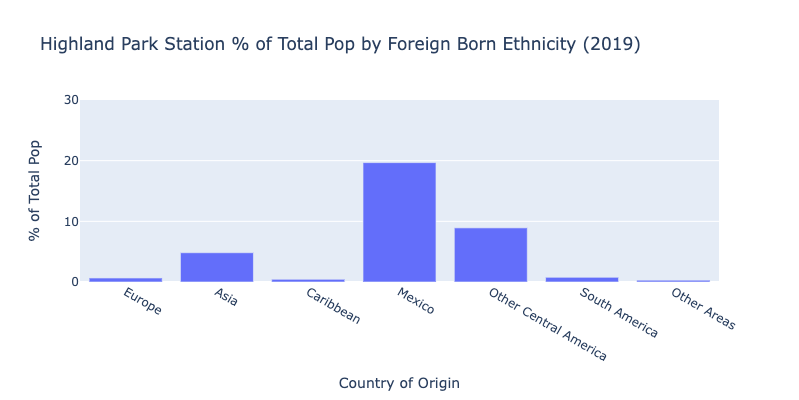

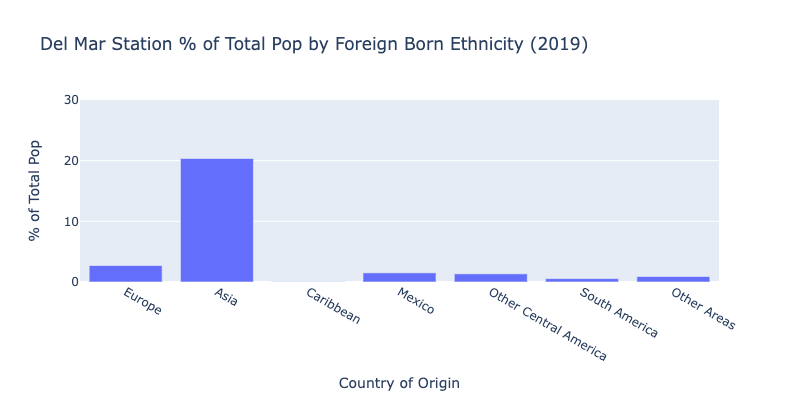

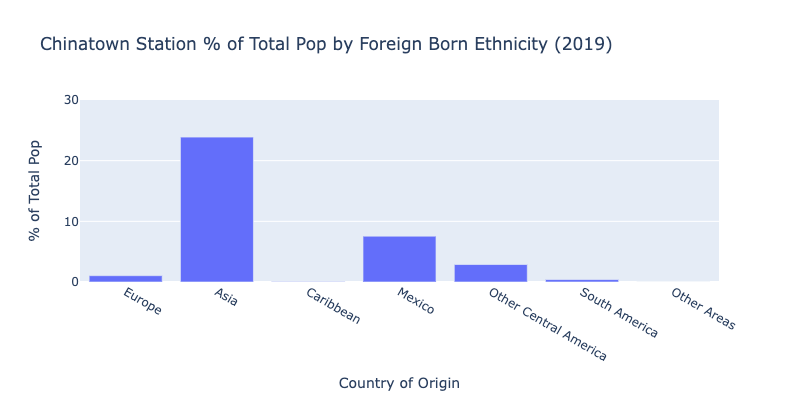

In [122]:
for crit_stn in crit_stns:
    stn_chart_country_html(station = crit_stn)